<a href="https://colab.research.google.com/github/sszhang91/CodeShare/blob/main/via_dc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Begin!

## Import packages

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Filter only rides that started and ended in Manhattan by joining on spatial data
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium

In [ ]:
from math import radians, sin, cos, sqrt, atan2

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the distance between two points on the Earth in meters
    using the Haversine formula.

    Args:
        lat1 (float): Latitude of the first point.
        lon1 (float): Longitude of the first point.
        lat2 (float): Latitude of the second point.
        lon2 (float): Longitude of the second point.

    Returns:
        float: Distance between the two points in meters.
    """
    # Radius of the Earth in meters
    R = 6371000

    # Convert degrees to radians
    lat1_rad = radians(lat1)
    lon1_rad = radians(lon1)
    lat2_rad = radians(lat2)
    lon2_rad = radians(lon2)

    # Difference in coordinates
    dlon = lon2_rad - lon1_rad
    dlat = lat2_rad - lat1_rad

    # Haversine formula
    a = sin(dlat / 2)**2 + cos(lat1_rad) * cos(lat2_rad) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance

## Load in files

In [ ]:
# load in the data from the csv

first_week_df=pd.read_csv('Data_Sources/first_week_df.csv')
first_week_df.info()

C:\Users\songt\AppData\Local\Temp\ipykernel_3172\2919177347.py:3: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  first_week_df=pd.read_csv('Data_Sources\\first_week_df.csv')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3402507 entries, 0 to 3402506
Data columns (total 22 columns):
 #   Column              Dtype  
---  ------              -----  
 0   medallion           object 
 1   hack_license        object 
 2   vendor_id_trip      object 
 3   rate_code           int64  
 4   store_and_fwd_flag  object 
 5   pickup_datetime     object 
 6   dropoff_datetime    object 
 7   passenger_count     int64  
 8   trip_time_in_secs   int64  
 9   trip_distance       float64
 10  pickup_longitude    float64
 11  pickup_latitude     float64
 12  dropoff_longitude   float64
 13  dropoff_latitude    float64
 14  vendor_id_fare      object 
 15  payment_type        object 
 16  fare_amount         float64
 17  surcharge           float64
 18  mta_tax             float64
 19  tip_amount          float64
 20  tolls_amount        float64
 21  total_amount        float64
dtypes: float64(11), int64(3), object(8)
memory usage: 571.1+ MB


In [ ]:
# Loading in from google drive instead for the final filtered one
rides_df=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/colab data/first_week_manhattan_filtered.csv')
# convert date time columns to datetime format
rides_df['pickup_hour'] = rides_df['pickup_datetime'].dt.hour
rides_df['pickup_weekday'] = rides_df['pickup_datetime'].dt.day_name()

#add a column so that it's encoded as a float with digits of [day][hour][minute] where day is 1-7, hour is 0-23, minute is 0-60
#offset weekday as 1, as by default monday is 0 instead
rides_df['pickup_numeric']=(rides_df['pickup_datetime'].dt.weekday+1)*10000+rides_df['pickup_hour']*100+rides_df['pickup_datetime'].dt.minute

rides_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2809597 entries, 0 to 2809596
Data columns (total 12 columns):
 #   Column             Dtype         
---  ------             -----         
 0   pickup_datetime    datetime64[ns]
 1   dropoff_datetime   datetime64[ns]
 2   pickup_longitude   float64       
 3   pickup_latitude    float64       
 4   dropoff_longitude  float64       
 5   dropoff_latitude   float64       
 6   trip_time_in_secs  int64         
 7   trip_distance      float64       
 8   fare_amount        float64       
 9   trip_time_in_mins  float64       
 10  pickup_hour        int32         
 11  pickup_weekday     object        
dtypes: datetime64[ns](2), float64(7), int32(1), int64(1), object(1)
memory usage: 246.5+ MB


In [ ]:
#load in borough map data

boroughsfile = "/content/drive/MyDrive/Colab Notebooks/colab data/nybb_25c/nybb_25c"
boroughs=gpd.read_file(boroughsfile)
boroughs.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   BoroCode    5 non-null      int32   
 1   BoroName    5 non-null      object  
 2   Shape_Leng  5 non-null      float64 
 3   Shape_Area  5 non-null      float64 
 4   geometry    5 non-null      geometry
dtypes: float64(2), geometry(1), int32(1), object(1)
memory usage: 312.0+ bytes


In [ ]:
boroughs_latlon=gpd.read_file("/content/drive/MyDrive/Colab Notebooks/colab data/nyc_boundaries.json")

## Match borough


Some notes: counting taxi trips in all 5 boroughs in the first full week of June is approximately 3.4 million. Out of these, approximately 400k originated outside of Manhattan. Of the approximate 3 million trips that originate within Manhattan, about 200k end outside of Manhattan, leaving 2.8 million rides that start and end within the borough of Manhattan in the first week of June 2013. The majority of those departing Manhattan to another borough is to Queens - likely to the airports. We could also check this with the fare rate code, but we would not include these either way because trips to/from airports include luggage, and luggage is often a reason riders want to go door to door.

Using these numbers as a sanity check, they are sensible for only rides within Manhattan.

In [ ]:
#read in the file from the zipped file
boroughs=gpd.read_file("Data_Sources\\nybb_25c")
boroughs.info()

#we will possibly clean this up later and add a function so we can also filter for other boroughs


In [ ]:

# assign borough to pick up coordinates
trip_copy_df=first_week_df.copy()
trip_copy_df['geometry']=gpd.points_from_xy(trip_copy_df['pickup_longitude'], trip_copy_df['pickup_latitude'],crs="EPSG:4326")
df_gpd=gpd.GeoDataFrame(data=trip_copy_df, geometry='geometry')

#convert it to the same projection as the boroughs one and then spatial join
df_gpd=df_gpd.to_crs(boroughs.crs)
#df_gpd.head(5)
joined_df = df_gpd.sjoin(boroughs, how="left")

#joined_df.head()
#drop anything that is not in Manhattan
manhattan_df=pd.DataFrame(joined_df[joined_df['BoroName']=='Manhattan'])

# keep original dataframe columns plus BoroName, drop other spatial join columns
original_cols = list(first_week_df.columns)
cols_to_keep = [c for c in original_cols + ['BoroName'] if c in manhattan_df.columns]
manhattan_df = manhattan_df[cols_to_keep].copy()


In [ ]:


#also go through and check for drop off points being in manhattan
# convert the dataframe to one with geometry in the same projection as the boroughs file
trip_copy_df=manhattan_df.copy()
trip_copy_df['geometry']=gpd.points_from_xy(trip_copy_df['dropoff_longitude'], trip_copy_df['dropoff_latitude'],crs="EPSG:4326")
df_gpd=gpd.GeoDataFrame(data=trip_copy_df, geometry='geometry')

#convert it to the same projection as the boroughs one
df_gpd=df_gpd.to_crs(boroughs.crs)


#spatial join on the dropoff points now
joined_df = df_gpd.sjoin(boroughs, how="left",lsuffix='pickup', rsuffix='dropoff')
joined_df=joined_df.drop(columns=['geometry','index_dropoff','BoroCode','Shape_Leng','Shape_Area'])
joined_df.info()
#only keep entries which have drop off also as manhattan
manhattan_df=joined_df[joined_df['BoroName_dropoff']=='Manhattan']
#check that now it's only manhattan for both pickup and dropoff
print('dropoff:',manhattan_df['BoroName_dropoff'].value_counts(dropna=False),'pickup:',manhattan_df['BoroName_pickup'].value_counts(dropna=False))

In [ ]:
#save this to a csv as our data, reset index
manhattan_df.reset_index(drop=True,inplace=True)
manhattan_df.to_csv('Data_Sources\\first_week_manhattan_only.csv',index=False)

## Visualisation and EDA

### Clean up data further
Check rate codes:
- Rate Code 1 is standard city fare
- Rate Code 2 is for trips between Manhattan and JFK Airport
- Rate Code 3 are trips to Newark-Liberty International Airport
- Rate Code 4 is for trips to the Counties of Westchester and Nassau
- Rate Code 5 is for trips on an agreed flat fare that go beyond NYC


In [ ]:
# Compare rate codes to ensure all are within the city
manhattan_df.rate_code.value_counts()

rate_code
1      2817565
2         1659
5          987
4          555
0          528
3          302
6           24
210          1
Name: count, dtype: int64

In [ ]:
manhattan_df[manhattan_df['rate_code']==6]
# The rate codes conflict with pickup and dropoff locations, we will drop these and only keep rate code 1

,medallion,hack_license,vendor_id_trip,rate_code,store_and_fwd_flag,pickup_datetime,dropoff_datetime,passenger_count,trip_time_in_secs,trip_distance,...,vendor_id_fare,payment_type,fare_amount,surcharge,mta_tax,tip_amount,tolls_amount,total_amount,BoroName_pickup,BoroName_dropoff
1059471,C5E7DAAD78CD782B3AD94A2E4423A590,8B638872E3D808C7755F5D3488E75F8E,CMT,6,N,2013-06-03 04:54:02,2013-06-03 04:59:07,4,305,1.1,...,CMT,CRD,2.5,0.0,0.5,6.0,0.0,9.0,Manhattan,Manhattan
1811414,3D987C3C488E22940557C69890C00B76,53B094A3C79C1677B912F0A9B97D6E58,CMT,6,Y,2013-06-03 09:56:14,2013-06-03 10:00:33,1,258,0.8,...,CMT,CSH,2.5,0.0,0.5,0.0,0.0,3.0,Manhattan,Manhattan
1875863,A9236AB56BD652C8450897CECC80C433,85A72DC93E848D4D294CFB674210D42F,CMT,6,N,2013-06-03 19:57:13,2013-06-03 20:10:44,1,810,1.5,...,CMT,CSH,8.5,1.0,0.5,0.0,0.0,10.0,Manhattan,Manhattan
1878341,A290F5FA5507BA0910540B504B53DF67,63C4096A6AB59BE83E33AF05E8C7C6FC,CMT,6,N,2013-06-03 23:02:52,2013-06-03 23:02:56,2,4,0.0,...,CMT,NOC,2.5,0.0,0.5,0.0,0.0,3.0,Manhattan,Manhattan
1881095,01A2F4366180AEB433600BAEA196BFC7,3D8E7431C0ACF64F4E5F39036C579121,CMT,6,N,2013-06-04 05:03:27,2013-06-04 05:03:33,1,5,0.3,...,CMT,CSH,2.5,0.0,0.5,0.0,0.0,3.0,Manhattan,Manhattan
1921555,75A87D5295FA61C37DAB811A6776670E,1211D5CB828FD8B12D69D66438AC299A,CMT,6,N,2013-06-03 23:22:38,2013-06-03 23:22:53,1,18,0.0,...,CMT,NOC,2.5,0.0,0.5,0.0,0.0,3.0,Manhattan,Manhattan
1962194,DCDA75D05E40040A79C49308FEEC2D47,62F154592F7D0CEE162DF64B7D18032B,CMT,6,N,2013-06-04 19:14:11,2013-06-04 19:14:17,1,5,0.0,...,CMT,NOC,5.5,0.0,0.5,0.0,0.0,6.0,Manhattan,Manhattan
1967319,A2AE43EA0DEEDDF519B92D86AEAF8C42,CF9230E109FC56388EC5A6B5EFF7BACF,CMT,6,N,2013-06-04 22:41:38,2013-06-04 22:43:19,1,101,0.3,...,CMT,CSH,2.5,0.0,0.5,0.0,0.0,3.0,Manhattan,Manhattan
1996763,4CF38C0C5DE00C68B5AFFF44857FE359,B1F57D162F1E490D15E9FF9EF46A4819,CMT,6,Y,2013-06-05 07:21:21,2013-06-05 07:21:33,1,11,0.0,...,CMT,NOC,2.5,0.0,0.5,0.0,0.0,3.0,Manhattan,Manhattan
2088615,3B0E8DC736D1E0D35C698D7B0BF9CBFA,F07C7815DF012E075C641602AA631C7A,CMT,6,N,2013-06-06 04:10:41,2013-06-06 04:10:45,1,4,0.0,...,CMT,NOC,2.5,0.0,0.5,0.0,0.0,3.0,Manhattan,Manhattan


In [ ]:
# Only keep rate code 1
manhattan_df=manhattan_df[manhattan_df['rate_code']==1]
manhattan_df.rate_code.value_counts()

rate_code
1    2817565
Name: count, dtype: int64

In [ ]:
# Only keep columns that we need, and drop all others. We will keep pickup and dropoff place and time, trip time, trip distance,
# and fare amount only. We will exclude surharges, taxes, tips, and tolls as we are only interested in efficiency of ride aggregation
# we will use the index as a trip ID
manhattan_df.info()
filtered_df=manhattan_df[['pickup_datetime','dropoff_datetime','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','trip_time_in_secs','trip_distance','fare_amount']]

<class 'pandas.core.frame.DataFrame'>
Index: 2817565 entries, 0 to 2821620
Data columns (total 24 columns):
 #   Column              Dtype  
---  ------              -----  
 0   medallion           object 
 1   hack_license        object 
 2   vendor_id_trip      object 
 3   rate_code           int64  
 4   store_and_fwd_flag  object 
 5   pickup_datetime     object 
 6   dropoff_datetime    object 
 7   passenger_count     int64  
 8   trip_time_in_secs   int64  
 9   trip_distance       float64
 10  pickup_longitude    float64
 11  pickup_latitude     float64
 12  dropoff_longitude   float64
 13  dropoff_latitude    float64
 14  vendor_id_fare      object 
 15  payment_type        object 
 16  fare_amount         float64
 17  surcharge           float64
 18  mta_tax             float64
 19  tip_amount          float64
 20  tolls_amount        float64
 21  total_amount        float64
 22  BoroName_pickup     object 
 23  BoroName_dropoff    object 
dtypes: float64(11), int64(3), obj

In [ ]:
filtered_df.info()
# convert date time columns to datetime format
filtered_df['pickup_datetime']=pd.to_datetime(filtered_df['pickup_datetime'])
filtered_df['dropoff_datetime']=pd.to_datetime(filtered_df['dropoff_datetime'])

<class 'pandas.core.frame.DataFrame'>
Index: 2817565 entries, 0 to 2821620
Data columns (total 9 columns):
 #   Column             Dtype  
---  ------             -----  
 0   pickup_datetime    object 
 1   dropoff_datetime   object 
 2   pickup_longitude   float64
 3   pickup_latitude    float64
 4   dropoff_longitude  float64
 5   dropoff_latitude   float64
 6   trip_time_in_secs  int64  
 7   trip_distance      float64
 8   fare_amount        float64
dtypes: float64(6), int64(1), object(2)
memory usage: 215.0+ MB


C:\Users\songt\AppData\Local\Temp\ipykernel_3172\2245010579.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['pickup_datetime']=pd.to_datetime(filtered_df['pickup_datetime'])
C:\Users\songt\AppData\Local\Temp\ipykernel_3172\2245010579.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['dropoff_datetime']=pd.to_datetime(filtered_df['dropoff_datetime'])


In [ ]:
filtered_df.describe()

# the pickup dates and times fall within the expected date range


,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount
count,2817565,2817565,2.817565e+06,2.817565e+06,2.817565e+06,2.817565e+06,2.817565e+06,2.817565e+06,2.817565e+06
mean,2013-06-06 13:37:53.229603072,2013-06-06 13:49:11.668627456,-7.398154e+01,4.075420e+01,-7.398066e+01,4.075542e+01,6.767375e+02,1.984586e+00,9.933858e+00
min,2013-06-03 00:00:00,2013-06-03 00:00:16,-7.401914e+01,4.069036e+01,-7.401920e+01,4.068693e+01,0.000000e+00,0.000000e+00,2.500000e+00
25%,2013-06-04 20:41:50,2013-06-04 20:51:16,-7.399281e+01,4.073940e+01,-7.399220e+01,4.073992e+01,3.600000e+02,1.000000e+00,6.500000e+00
50%,2013-06-06 14:47:56,2013-06-06 15:01:00,-7.398246e+01,4.075482e+01,-7.398187e+01,4.075556e+01,5.980000e+02,1.600000e+00,9.000000e+00
75%,2013-06-08 02:45:00,2013-06-08 02:54:00,-7.397068e+01,4.076837e+01,-7.397001e+01,4.076967e+01,9.000000e+02,2.500000e+00,1.200000e+01
max,2013-06-09 23:59:13,2013-06-09 23:59:59,-7.390809e+01,4.087601e+01,-7.390765e+01,4.087891e+01,9.135000e+03,8.210000e+01,1.515000e+02
std,NaN,NaN,1.643561e-02,2.182554e-02,1.730027e-02,2.363644e-02,4.261150e+02,1.489904e+00,4.956441e+00


In [ ]:
# look at ones where trip time and distance is zero
#filtered_df[(filtered_df['trip_time_in_secs']==0)]
filtered_df[(filtered_df['trip_distance']==0)]

,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount
675,2013-06-08 09:11:00,2013-06-08 09:18:00,-73.969101,40.790741,-73.968628,40.769741,420,0.0,6.0
1148,2013-06-08 05:15:00,2013-06-08 05:15:00,-73.966324,40.764832,-73.966324,40.764832,0,0.0,2.5
2275,2013-06-08 04:07:00,2013-06-08 04:08:00,-74.006676,40.744190,-74.006630,40.744198,60,0.0,3.0
3409,2013-06-08 08:50:00,2013-06-08 08:50:00,-73.997551,40.724541,-73.997551,40.724541,0,0.0,2.5
3777,2013-06-08 09:25:00,2013-06-08 09:28:00,-73.969391,40.785191,-73.960686,40.779922,180,0.0,3.5
...,...,...,...,...,...,...,...,...,...
2815132,2013-06-07 17:16:00,2013-06-07 17:16:00,-73.957764,40.785110,-73.957733,40.785103,0,0.0,2.5
2816076,2013-06-07 17:59:00,2013-06-07 18:00:00,-73.953766,40.813271,-73.953766,40.813271,60,0.0,2.5
2816367,2013-06-07 16:49:00,2013-06-07 16:55:00,-73.977257,40.753677,-73.960747,40.769547,360,0.0,5.5
2816826,2013-06-07 15:36:00,2013-06-07 15:41:00,-74.005341,40.736023,-74.005341,40.736012,300,0.0,5.0


In [ ]:
# Since we have a lot of data points, and the ones with zero distance or time could either be errors
# or 'trips' that were cancelled immediately, and there are not too many of them, we will drop these rows
filtered_df=filtered_df[(filtered_df['trip_distance']>0) & (filtered_df['trip_time_in_secs']>0)]
filtered_df.describe()

,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount
count,2809597,2809597,2.809597e+06,2.809597e+06,2.809597e+06,2.809597e+06,2.809597e+06,2.809597e+06,2.809597e+06
mean,2013-06-06 13:37:32.779827200,2013-06-06 13:48:52.829996800,-7.398154e+01,4.075420e+01,-7.398066e+01,4.075543e+01,6.783500e+02,1.989303e+00,9.949293e+00
min,2013-06-03 00:00:00,2013-06-03 00:01:00,-7.401914e+01,4.069036e+01,-7.401920e+01,4.068693e+01,1.000000e+00,1.000000e-02,2.500000e+00
25%,2013-06-04 20:41:35,2013-06-04 20:51:05,-7.399281e+01,4.073940e+01,-7.399220e+01,4.073993e+01,3.600000e+02,1.000000e+00,6.500000e+00
50%,2013-06-06 14:47:15,2013-06-06 15:01:00,-7.398245e+01,4.075482e+01,-7.398186e+01,4.075556e+01,6.000000e+02,1.600000e+00,9.000000e+00
75%,2013-06-08 02:43:48,2013-06-08 02:53:00,-7.397068e+01,4.076837e+01,-7.397001e+01,4.076967e+01,9.000000e+02,2.500000e+00,1.250000e+01
max,2013-06-09 23:58:07,2013-06-09 23:59:59,-7.390809e+01,4.087601e+01,-7.390765e+01,4.087891e+01,9.135000e+03,8.210000e+01,1.515000e+02
std,NaN,NaN,1.643414e-02,2.182181e-02,1.730072e-02,2.363734e-02,4.253873e+02,1.488706e+00,4.950980e+00


In [ ]:
# for human readability, convert trip time from seconds to minutes
filtered_df['trip_time_in_mins']=filtered_df['trip_time_in_secs']/60
filtered_df.describe()

,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount,trip_time_in_mins
count,2809597,2809597,2.809597e+06,2.809597e+06,2.809597e+06,2.809597e+06,2.809597e+06,2.809597e+06,2.809597e+06,2.809597e+06
mean,2013-06-06 13:37:32.779827200,2013-06-06 13:48:52.829996800,-7.398154e+01,4.075420e+01,-7.398066e+01,4.075543e+01,6.783500e+02,1.989303e+00,9.949293e+00,1.130583e+01
min,2013-06-03 00:00:00,2013-06-03 00:01:00,-7.401914e+01,4.069036e+01,-7.401920e+01,4.068693e+01,1.000000e+00,1.000000e-02,2.500000e+00,1.666667e-02
25%,2013-06-04 20:41:35,2013-06-04 20:51:05,-7.399281e+01,4.073940e+01,-7.399220e+01,4.073993e+01,3.600000e+02,1.000000e+00,6.500000e+00,6.000000e+00
50%,2013-06-06 14:47:15,2013-06-06 15:01:00,-7.398245e+01,4.075482e+01,-7.398186e+01,4.075556e+01,6.000000e+02,1.600000e+00,9.000000e+00,1.000000e+01
75%,2013-06-08 02:43:48,2013-06-08 02:53:00,-7.397068e+01,4.076837e+01,-7.397001e+01,4.076967e+01,9.000000e+02,2.500000e+00,1.250000e+01,1.500000e+01
max,2013-06-09 23:58:07,2013-06-09 23:59:59,-7.390809e+01,4.087601e+01,-7.390765e+01,4.087891e+01,9.135000e+03,8.210000e+01,1.515000e+02,1.522500e+02
std,NaN,NaN,1.643414e-02,2.182181e-02,1.730072e-02,2.363734e-02,4.253873e+02,1.488706e+00,4.950980e+00,7.089788e+00


In [ ]:
# save this further filtered data to a csv
filtered_df.to_csv('Data_Sources\\first_week_manhattan_filtered.csv',index=False)

### Visualisation

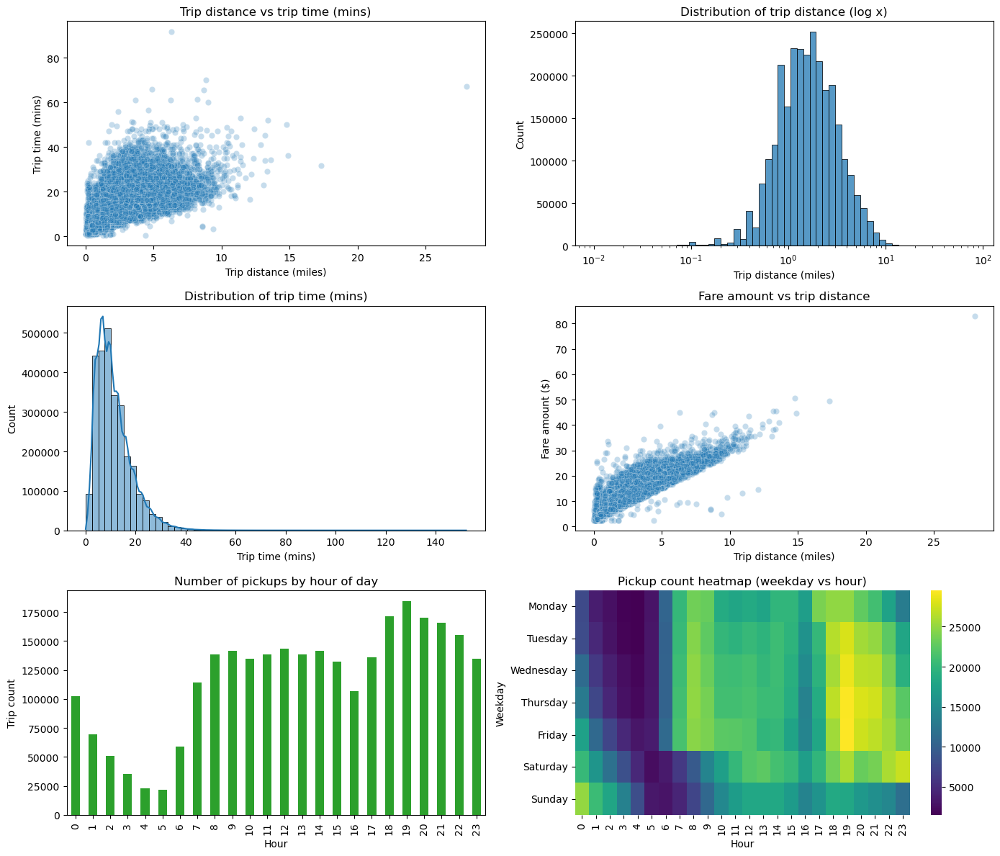

In [ ]:
# Visualisations for filtered_df (new cell at index 21)
# relies on plt and sns being available in the notebook (they are imported in a later cell)


# derive time features
filtered_df['pickup_hour'] = filtered_df['pickup_datetime'].dt.hour
filtered_df['pickup_weekday'] = filtered_df['pickup_datetime'].dt.day_name()

# sample to avoid plotting millions of points on scatter panels
sample_df = filtered_df.sample(n=40000, random_state=1) if len(filtered_df) > 40000 else filtered_df


fig, axes = plt.subplots(3, 2, figsize=(14,12))

# 1) Distance vs time
sns.scatterplot(data=sample_df, x='trip_distance', y='trip_time_in_mins', alpha=0.25, ax=axes[0,0])
axes[0,0].set_title('Trip distance vs trip time (mins)')
axes[0,0].set_xlabel('Trip distance (miles)')
axes[0,0].set_ylabel('Trip time (mins)')

# 2) Distance distribution (log x for readability)
sns.histplot(filtered_df['trip_distance'], bins=60, ax=axes[0,1], log_scale=(True, False))
axes[0,1].set_title('Distribution of trip distance (log x)')
axes[0,1].set_xlabel('Trip distance (miles)')

# 3) Trip time distribution
sns.histplot(filtered_df['trip_time_in_mins'], bins=60, ax=axes[1,0], kde=True)
axes[1,0].set_title('Distribution of trip time (mins)')
axes[1,0].set_xlabel('Trip time (mins)')

# 4) Fare vs distance
sns.scatterplot(data=sample_df, x='trip_distance', y='fare_amount', alpha=0.25, ax=axes[1,1])
axes[1,1].set_title('Fare amount vs trip distance')
axes[1,1].set_xlabel('Trip distance (miles)')
axes[1,1].set_ylabel('Fare amount ($)')

# 5) Trips by pickup hour
hour_counts = filtered_df['pickup_hour'].value_counts().sort_index()
hour_counts.plot(kind='bar', ax=axes[2,0], color='C2')
axes[2,0].set_title('Number of pickups by hour of day')
axes[2,0].set_xlabel('Hour')
axes[2,0].set_ylabel('Trip count')

# 6) Heatmap: weekday vs hour (counts)
pivot = (
    filtered_df
    .pivot_table(index='pickup_weekday', columns='pickup_hour', values='trip_distance', aggfunc='count')
    .reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
)
sns.heatmap(pivot.fillna(0), cmap='viridis', ax=axes[2,1])
axes[2,1].set_title('Pickup count heatmap (weekday vs hour)')
axes[2,1].set_xlabel('Hour')
axes[2,1].set_ylabel('Weekday')

plt.tight_layout()

Text(0.5, 1.0, 'Pickup and Dropoff Locations in Manhattan')

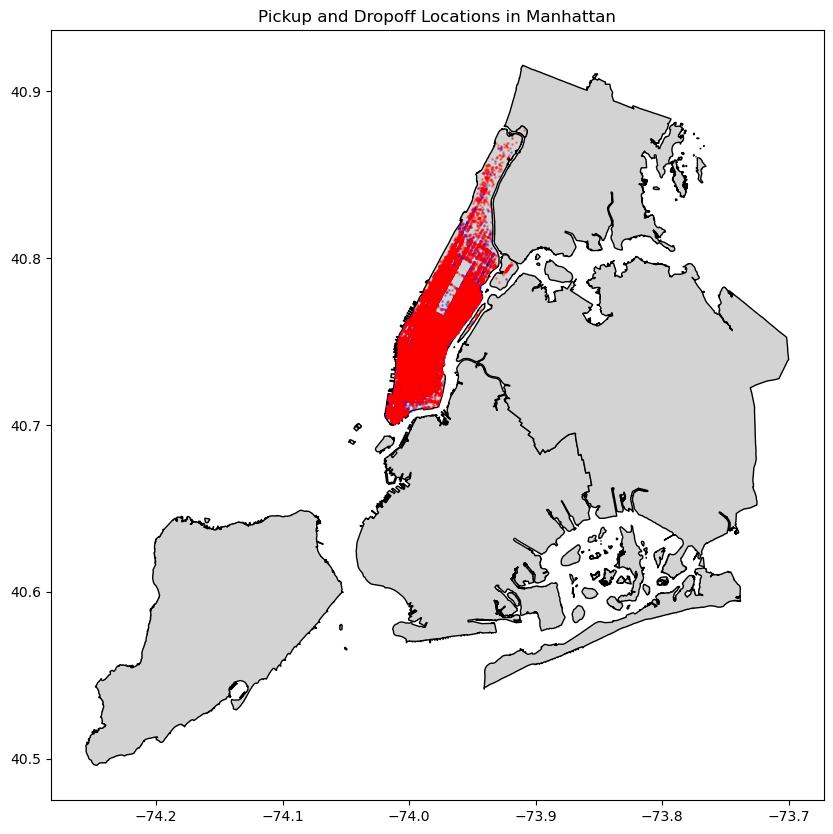

In [ ]:
# Plot a selection of pickup and dropoff locations on the boroughs map
fig, ax = plt.subplots(figsize=(10,10))
#boroughs_latlon=gpd.read_file("Data_Sources\\nyc_borough_boundary.json")
boroughs_latlon.plot(ax=ax, color='lightgrey', edgecolor='black')
ax.scatter(sample_df['pickup_longitude'], sample_df['pickup_latitude'], color='blue', alpha=0.3, s=1, label='Pickup')
ax.scatter(sample_df['dropoff_longitude'], sample_df['dropoff_latitude'], color='red', alpha=0.3, s=1, label='Dropoff')
ax.set_title('Pickup and Dropoff Locations in Manhattan')

# they are all in Manhattan yay!

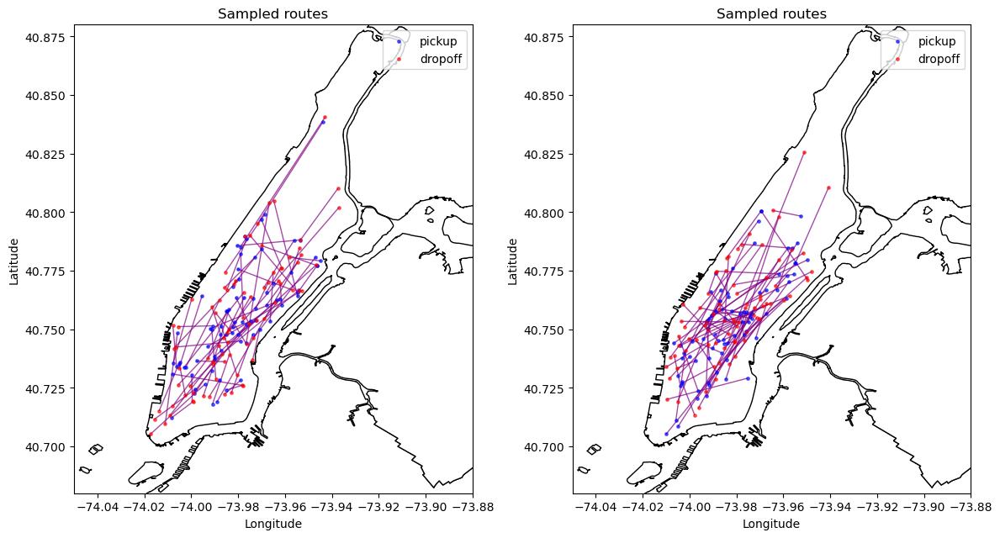

In [ ]:
# Check a few routes

n_per_period = 80  # small selection per period



fig, axes = plt.subplots(1, 2, figsize=(12, 10))
axes = axes.flatten()

for i in range(0,2):
    ax = axes[i]
    # plot borough boundaries for context
    boroughs_latlon.plot(ax=ax, color='white', edgecolor='black')
    df_sample_period = sample_df.sample(n=n_per_period)
    # draw each route
    for _, r in df_sample_period.iterrows():
        ax.plot([r['pickup_longitude'], r['dropoff_longitude']],
                [r['pickup_latitude'], r['dropoff_latitude']],
                color='purple', alpha=0.7, linewidth=1, zorder=2)

    # optional: show pickup / dropoff points for sampled routes
    ax.scatter(df_sample_period['pickup_longitude'], df_sample_period['pickup_latitude'],
               color='blue', s=6, alpha=0.6, label='pickup', zorder=3)
    ax.scatter(df_sample_period['dropoff_longitude'], df_sample_period['dropoff_latitude'],
               color='red', s=6, alpha=0.6, label='dropoff', zorder=3)

    ax.set_title('Sampled routes')
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-74.05,-73.88)
    ax.set_ylim(40.68,40.88)
    ax.set_aspect('equal', adjustable='box')
    ax.legend(loc='upper right')

# hide any unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)


plt.tight_layout()
plt.show()

# There is no noticeable pattern

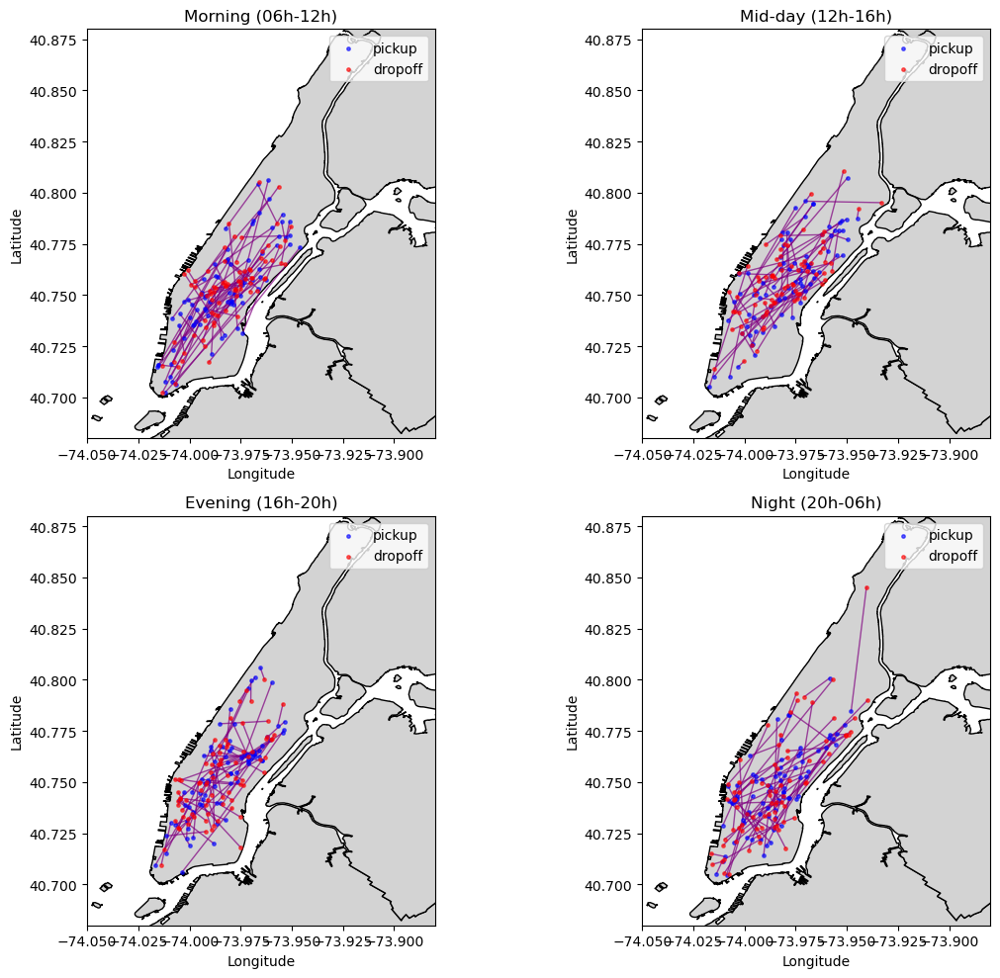

In [ ]:
# Plot a small selection of routes (pickup -> dropoff) by time-of-day periods
# relies on existing variables: sample_df (sample of filtered_df), boroughs_latlon, plt
sample_df = filtered_df.sample(n=40000, random_state=1) if len(filtered_df) > 40000 else filtered_df

n_per_period = 80  # small selection per period
periods = {
    "Morning (06h-12h)": ((sample_df['pickup_hour'] >= 6) & (sample_df['pickup_hour'] < 12), "blue"),
    "Mid-day (12h-16h)":  ((sample_df['pickup_hour'] >= 12) & (sample_df['pickup_hour'] < 16), "green"),
    "Evening (16h-20h)":  ((sample_df['pickup_hour'] >= 16) & (sample_df['pickup_hour'] < 20), "orange"),
    "Night (20h-06h)":    (((sample_df['pickup_hour'] >= 20) | (sample_df['pickup_hour'] < 6)), "purple"),
}

# Plot each time-of-day period on its own subplot (uses existing variables: sample_df, periods, n_per_period, boroughs_latlon, plt)
period_items = list(periods.items())
n_periods = len(period_items)
ncols = 2
nrows = (n_periods + 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 10))
axes = axes.flatten()

for i, (label, (cond, color)) in enumerate(period_items):
    ax = axes[i]
    # plot borough boundaries for context
    boroughs_latlon.plot(ax=ax, color='lightgrey', edgecolor='black')
    df_period = sample_df.loc[cond].dropna(subset=['pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude'])
    if df_period.empty:
        ax.set_title(f"{label} (no data)")
        continue

    df_sample_period = df_period.sample(n=min(n_per_period, len(df_period)))
    # draw each route
    for _, r in df_sample_period.iterrows():
        ax.plot([r['pickup_longitude'], r['dropoff_longitude']],
                [r['pickup_latitude'], r['dropoff_latitude']],
                color='purple', alpha=0.7, linewidth=1, zorder=2)

    # optional: show pickup / dropoff points for sampled routes
    ax.scatter(df_sample_period['pickup_longitude'], df_sample_period['pickup_latitude'],
               color='blue', s=6, alpha=0.6, label='pickup', zorder=3)
    ax.scatter(df_sample_period['dropoff_longitude'], df_sample_period['dropoff_latitude'],
               color='red', s=6, alpha=0.6, label='dropoff', zorder=3)

    ax.set_title(label)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-74.05,-73.88)
    ax.set_ylim(40.68,40.88)
    ax.set_aspect('equal', adjustable='box')
    ax.legend(loc='upper right')

# hide any unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)


plt.tight_layout()
plt.show()

# There is no noticeable pattern

### Spatial maps based on period of day

In [ ]:
sample_df = rides_df.sample(n=40000, random_state=1) if len(rides_df) > 40000 else rides_df

periods = {
    "Morning (06h-12h)": ((sample_df['pickup_hour'] >= 6) & (sample_df['pickup_hour'] < 12), "blue"),
    "Mid-day (12h-16h)":  ((sample_df['pickup_hour'] >= 12) & (sample_df['pickup_hour'] < 16), "green"),
    "Evening (16h-20h)":  ((sample_df['pickup_hour'] >= 16) & (sample_df['pickup_hour'] < 20), "orange"),
    "Night (20h-06h)":    (((sample_df['pickup_hour'] >= 20) | (sample_df['pickup_hour'] < 6)), "purple"),
}

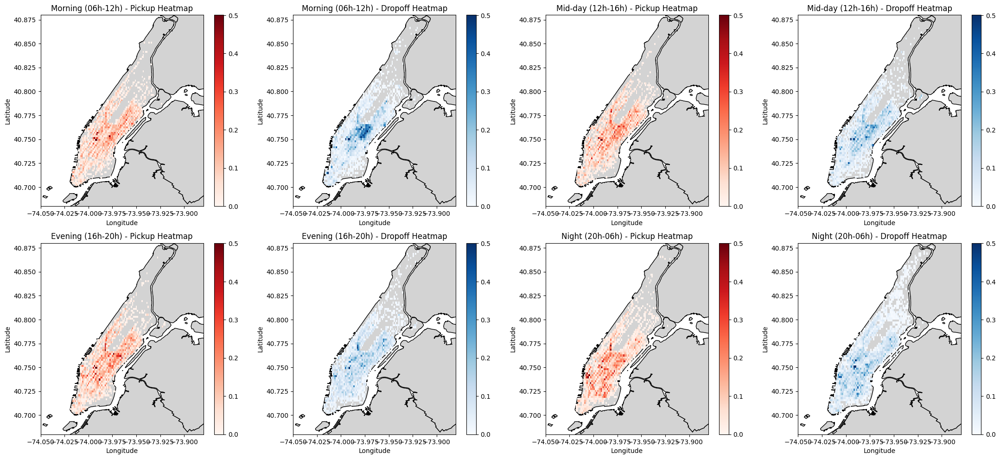

In [ ]:
# Create spatial heatmaps for pickup and dropoff locations based on time periods
n_periods = len(periods)
ncols = 2
nrows = (n_periods + 1) // ncols

fig, axes = plt.subplots(nrows, ncols * 2, figsize=(22, 10)) # Increased figure size for two heatmaps per row
axes = axes.flatten()

period_items = list(periods.items())

# Calculate the maximum percentage across all heatmaps for consistent colorbar limits
max_percent = 0
min_percent = 100
for label, (cond, color) in periods.items():
    df_period_pickup = sample_df.loc[cond].dropna(subset=['pickup_longitude', 'pickup_latitude'])
    if not df_period_pickup.empty:
        hist_pickup, _, _ = np.histogram2d(df_period_pickup['pickup_longitude'], df_period_pickup['pickup_latitude'], bins=80)
        # Calculate percentage for each bin
        hist_pickup_percent = (hist_pickup / hist_pickup.sum()) * 100 if hist_pickup.sum() > 0 else hist_pickup
        max_percent = max(max_percent, hist_pickup_percent.max())
        min_percent = min(min_percent, hist_pickup_percent.min())

    df_period_dropoff = sample_df.loc[cond].dropna(subset=['dropoff_longitude', 'dropoff_latitude'])
    if not df_period_dropoff.empty:
        hist_dropoff, _, _ = np.histogram2d(df_period_dropoff['dropoff_longitude'], df_period_dropoff['dropoff_latitude'], bins=80)
        # Calculate percentage for each bin
        hist_dropoff_percent = (hist_dropoff / hist_dropoff.sum()) * 100 if hist_dropoff.sum() > 0 else hist_dropoff
        max_percent = max(max_percent, hist_dropoff_percent.max())
        min_percent = min(min_percent, hist_pickup_percent.min())

min_lim=min_percent*1.1
max_lim=max_percent*0.5

for i, (label, (cond, color)) in enumerate(period_items):
    # Pickup heatmap
    ax1 = axes[i * 2]
    # Plot borough boundaries
    boroughs_latlon.plot(ax=ax1, color='lightgrey', edgecolor='black')
    df_period_pickup = sample_df.loc[cond].dropna(subset=['pickup_longitude', 'pickup_latitude'])
    if not df_period_pickup.empty:
        sns.histplot(x='pickup_longitude', y='pickup_latitude', data=df_period_pickup, bins=80, cmap='Reds', ax=ax1, cbar=True, stat="percent", vmax=max_lim,vmin=min_lim)
        ax1.set_title(f"{label} - Pickup Heatmap")
        ax1.set_xlabel("Longitude")
        ax1.set_ylabel("Latitude")
        ax1.set_xlim(-74.05,-73.88)
        ax1.set_ylim(40.68,40.88)
        ax1.set_aspect('equal', adjustable='box')
    else:
        ax1.set_title(f"{label} - Pickup Heatmap (no data)")


    # Dropoff heatmap
    ax2 = axes[i * 2 + 1]
    # Plot borough boundaries
    boroughs_latlon.plot(ax=ax2, color='lightgrey', edgecolor='black')
    df_period_dropoff = sample_df.loc[cond].dropna(subset=['dropoff_longitude', 'dropoff_latitude'])
    if not df_period_dropoff.empty:
        sns.histplot(x='dropoff_longitude', y='dropoff_latitude', data=df_period_dropoff, bins=80, cmap='Blues', ax=ax2, cbar=True, stat="percent", vmax=max_lim,vmin=min_lim)
        ax2.set_title(f"{label} - Dropoff Heatmap")
        ax2.set_xlabel("Longitude")
        ax2.set_ylabel("Latitude")
        ax2.set_xlim(-74.05,-73.88)
        ax2.set_ylim(40.68,40.88)
        ax2.set_aspect('equal', adjustable='box')
    else:
        ax2.set_title(f"{label} - Dropoff Heatmap (no data)")


# Hide any unused subplots
for j in range(i * 2 + 2, len(axes)):
    axes[j].set_visible(False)


plt.tight_layout()
plt.show()

### Clustering based on ride characteristics

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Sample the entire week's data
# Adjust sample size as needed
sample_size_kmeans = 50000 # Increased sample size for better representation
rides_sample_kmeans = rides_df.sample(n=sample_size_kmeans, random_state=42) if len(rides_df) > sample_size_kmeans else rides_df.copy()


# Select features for clustering
# Using pickup_numeric for pickup time
kmeans_features = rides_sample_kmeans[['pickup_numeric', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'trip_distance', 'fare_amount']]

# Scale the features
scaler_kmeans = StandardScaler()
scaled_features_kmeans = scaler_kmeans.fit_transform(kmeans_features)

# Perform KMeans clustering
# Choose a number of clusters (n_clusters) - this is a hyperparameter that needs tuning
# A starting point could be based on the number of clusters found by HDBSCAN or simply an educated guess
n_clusters_kmeans = 400 # Example: starting with 400 clusters
kmeans = KMeans(n_clusters=n_clusters_kmeans, random_state=42, n_init=10)
clusters_kmeans = kmeans.fit_predict(scaled_features_kmeans)

# Add cluster labels to the dataframe
rides_sample_kmeans['kmeans_cluster'] = clusters_kmeans

# Display clustering results and sample data with cluster labels
print(f"Number of samples used for KMeans: {len(rides_sample_kmeans)}")
print(f"Number of KMeans clusters: {n_clusters_kmeans}")

display(rides_sample_kmeans.head())

## Clustering

The plan: use clustering to identify possible aggregateable rides, and then use optimisation to assign aggregations

### Visualise clustering

In [ ]:
# Let's try to cluster thigns!
# Also we will talk about our metric here... Ride Aggregation Efficiency Metric...
# Set our assumptions and approach
# Define our metric
# define clustering approach

In [503]:
# Select points with pickup times between 07:00 and 07:30 on June 6th
start_hh_mm='09:00'
end_hh_mm='09:30'
day_of_week='Monday'
start_time = pd.to_datetime('2013-06-03 '+start_hh_mm)
end_time = pd.to_datetime('2013-06-03 '+end_hh_mm)
rides_monday=rides_df[rides_df['pickup_weekday']==day_of_week]
sample_monday = rides_monday.sample(n=50000, random_state=1) if len(rides_monday) > 50000 else rides_monday

rides_monday_morning = sample_monday[
    (sample_monday['pickup_datetime'] >= start_time) &
    (sample_monday['pickup_datetime'] < end_time)
]

# Sample up to 1000 points if there are more than 1000
sample_size = min(5000, len(rides_monday_morning))
rides_sample = rides_monday_morning.sample(n=sample_size, random_state=42) if sample_size > 0 else rides_monday_morning.copy()



print(f"Number of rides on Monday: {len(rides_monday)}")
print(f"Number of rides found between 07:30 and 08:00 on Monday: {len(rides_monday_morning)}")
print(f"Number of rides selected for sample: {len(rides_sample)}")


Number of rides on Monday: 375304
Number of rides found between 07:30 and 08:00 on Monday: 1661
Number of rides selected for sample: 1661


Text(0.5, 1.0, 'Dropoff from rides picked up Monday 09:00-09:30')

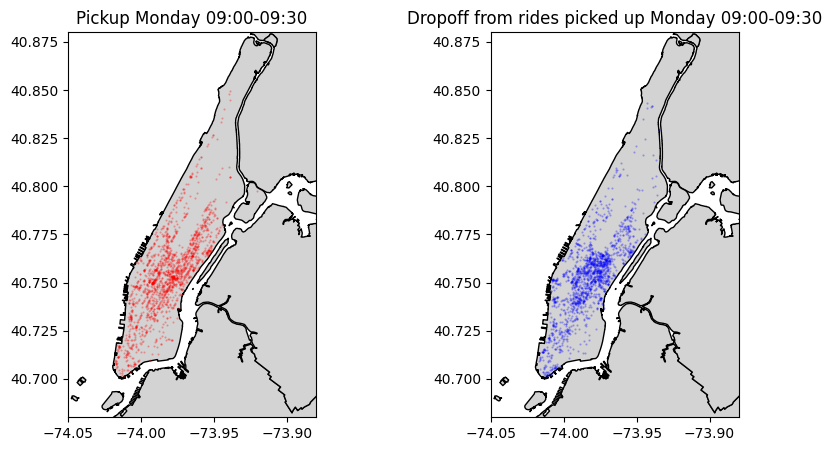

In [504]:

#plot them in a scatter
fig, ax = plt.subplots(1,2,figsize=(10,5))
# Plot borough boundaries
ax1=ax[0]
boroughs_latlon.plot(ax=ax1, color='lightgrey', edgecolor='black')
ax1.scatter(rides_sample['pickup_longitude'], rides_sample['pickup_latitude'], color='red', alpha=0.3, s=0.3, label='Pickup')
ax1.set_xlim(-74.05,-73.88)
ax1.set_ylim(40.68,40.88)
ax1.set_title(f"Pickup {day_of_week} {start_hh_mm}-{end_hh_mm}")

ax2=ax[1]
boroughs_latlon.plot(ax=ax2, color='lightgrey', edgecolor='black')
ax2.scatter(rides_sample['dropoff_longitude'], rides_sample['dropoff_latitude'], color='blue', alpha=0.3, s=0.3, label='Dropoff')
ax2.set_xlim(-74.05,-73.88)
ax2.set_ylim(40.68,40.88)
ax2.set_title(f"Dropoff from rides picked up {day_of_week} {start_hh_mm}-{end_hh_mm}")

Text(0.5, 1.0, 'Dropoff from rides picked up 09:00-09:30 Monday')

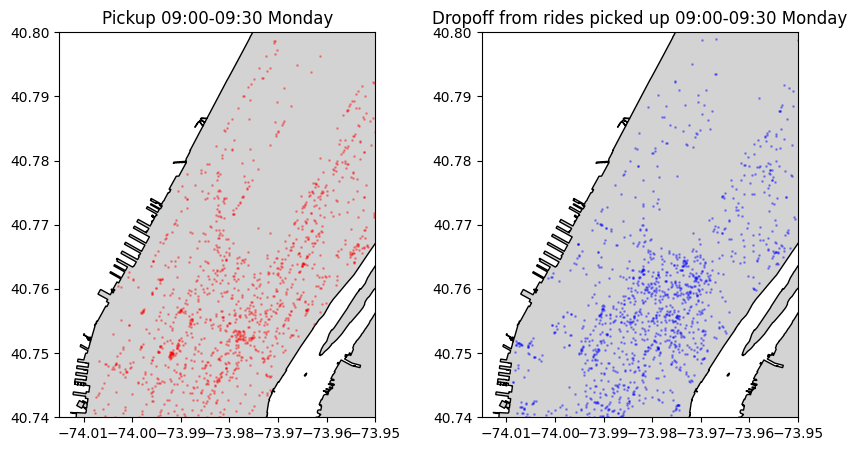

In [505]:
#zoom in to a smaller area
#plot them in a scatter
fig, ax = plt.subplots(1,2,figsize=(10,5))
# Plot borough boundaries
ax1=ax[0]
boroughs_latlon.plot(ax=ax1, color='lightgrey', edgecolor='black')
ax1.scatter(rides_sample['pickup_longitude'], rides_sample['pickup_latitude'], color='red', alpha=0.3, s=1, label='Pickup')
ax1.set_xlim(-74.015,-73.95)
ax1.set_ylim(40.74,40.8)
ax1.set_title(f"Pickup {start_hh_mm}-{end_hh_mm} Monday")

ax2=ax[1]
boroughs_latlon.plot(ax=ax2, color='lightgrey', edgecolor='black')
ax2.scatter(rides_sample['dropoff_longitude'], rides_sample['dropoff_latitude'], color='blue', alpha=0.3, s=1, label='Dropoff')
ax2.set_xlim(-74.015,-73.95)
ax2.set_ylim(40.74,40.8)
ax2.set_title(f"Dropoff from rides picked up {start_hh_mm}-{end_hh_mm} Monday")

#Can see some clear clusters!

### Perform clustering (hdbscan, dbscan, kmeans)

In [506]:
# We want to cluster based on pickup and drop off coordinates, and pickup time
#using the same cluster features for all 3 clustering methods
cluster_features=rides_sample[['pickup_numeric','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude']]
scaler=StandardScaler()
scaled_features=scaler.fit_transform(cluster_features)

#### hdbscan

In [588]:
# We want to cluster based on pickup and drop off coordinates, and pickup time

# <class 'pandas.core.frame.DataFrame'>
# RangeIndex: 2809597 entries, 0 to 2809596
# Data columns (total 12 columns):
#  #   Column             Dtype
# ---  ------             -----
#  0   pickup_datetime    datetime64[ns]
#  1   dropoff_datetime   datetime64[ns]
#  2   pickup_longitude   float64
#  3   pickup_latitude    float64
#  4   dropoff_longitude  float64
#  5   dropoff_latitude   float64
#  6   trip_time_in_secs  int64
#  7   trip_distance      float64
#  8   fare_amount        float64
#  9   trip_time_in_mins   float64
#  10  pickup_hour        int32
#  11  pickup_weekday     object'

#convert pickup_datetime to something numeric
#from sklearn.cluster import HDBSCAN
#from hdbscan import HDBSCAN

# perform HDBSCAN clustering with the defined parameters

# User wants min_cluster_size = 2 and max_cluster_size = 5.
# HDBSCAN has a 'min_cluster_size' parameter. It does not have a direct 'max_cluster_size' parameter.
# The 'cluster_selection_epsilon' parameter can sometimes help in splitting larger clusters,
# but it's not a strict maximum size.
# Let's use min_cluster_size and a relatively small cluster_selection_epsilon to encourage smaller clusters.
# We can also potentially filter clusters by size after clustering.

min_clust_size=2
clust_sel_eps_max=0.5
clust_sel_eps_min=0
hdbscan = HDBSCAN(min_cluster_size=min_clust_size,cluster_selection_epsilon_max=clust_sel_eps_max)
#hdbscan = HDBSCAN(min_cluster_size=2,store_centers='centroid')
clusters = hdbscan.fit_predict(scaled_features)


# Add cluster labels to the dataframe
rides_sample['hdbscan_cluster'] = clusters

# Print some clustering results
n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
n_noise = list(clusters).count(-1)
avg_cluster_size = np.mean(np.bincount(clusters[clusters != -1]))
max_cluster_size=np.max(np.bincount(clusters[clusters != -1]))
print(f"Estimated number of clusters: {n_clusters}")
print(f"Estimated number of noise points: {n_noise}")
print(f"Average cluster size: {avg_cluster_size}")
print(f"Max cluster size: {max_cluster_size}")
print(f"Percent rides aggregated: {(sample_size-n_noise)/sample_size}")

# Display the first few rows with cluster labels
display(rides_sample.head())


Estimated number of clusters: 90
Estimated number of noise points: 1254
Average cluster size: 4.522222222222222
Max cluster size: 20
Percent rides aggregated: 0.24503311258278146


/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount,trip_time_in_mins,pickup_hour,pickup_weekday,pickup_numeric,cluster,hdbscan_cluster,dbscan_cluster
357361,2013-06-03 09:16:00,2013-06-03 09:37:00,-73.975006,40.752567,-73.953590,40.766773,1260,2.49,14.0,21.000000,9,Monday,10916,-1,-1,0
370482,2013-06-03 09:25:00,2013-06-03 09:30:00,-73.997818,40.746113,-74.004883,40.751945,300,0.81,5.5,5.000000,9,Monday,10925,-1,9,1
1853761,2013-06-03 09:01:45,2013-06-03 09:18:50,-74.004112,40.721931,-74.006439,40.746204,1025,2.10,12.0,17.083333,9,Monday,10901,-1,-1,-1
1806296,2013-06-03 09:04:55,2013-06-03 09:12:40,-74.014984,40.716759,-74.008621,40.712364,465,0.50,6.5,7.750000,9,Monday,10904,-1,-1,-1
1826402,2013-06-03 09:18:00,2013-06-03 09:24:11,-73.991478,40.741035,-73.997147,40.734856,370,0.60,5.5,6.166667,9,Monday,10918,-1,-1,1


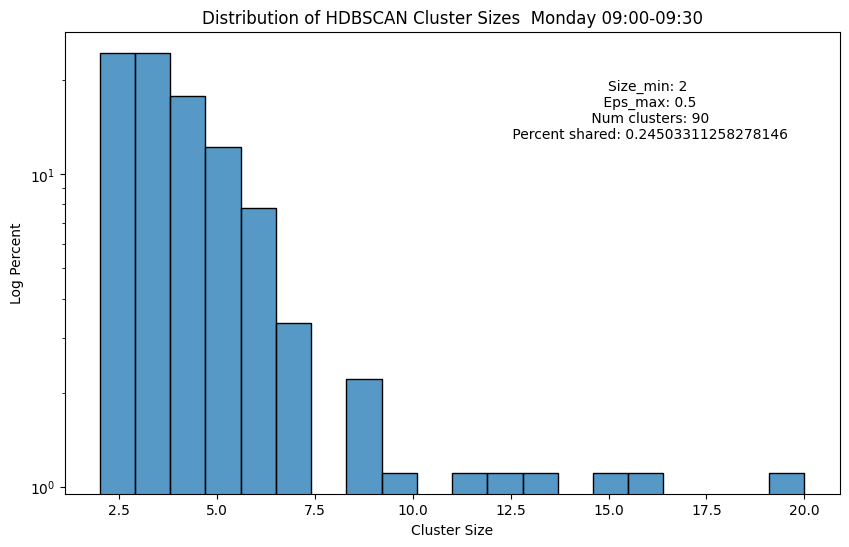

In [589]:
# Calculate the size of each cluster (excluding noise)
cluster_sizes = rides_sample['hdbscan_cluster'].value_counts()
cluster_sizes = cluster_sizes[cluster_sizes.index != -1] # Exclude noise cluster

# Plot a histogram of cluster sizes
plt.figure(figsize=(10, 6))
sns.histplot(cluster_sizes, bins=20, kde=False,stat="percent")
plt.text(max(cluster_sizes)*0.8, max_cluster_size*0.8, f"Size_min: {min_clust_size}\n Eps_max: {clust_sel_eps_max}\n Num clusters: {n_clusters}\n Percent shared: {(sample_size-n_noise)/sample_size}", horizontalalignment='center',
     verticalalignment='center')
plt.title(f'Distribution of HDBSCAN Cluster Sizes  {day_of_week} {start_hh_mm}-{end_hh_mm}')
plt.xlabel('Cluster Size')
plt.ylabel('Log Percent')
plt.yscale('log') # Use a log scale for the y-axis to better visualize smaller clusters

plt.show()

/tmp/ipython-input-2621728160.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', n_clusters)


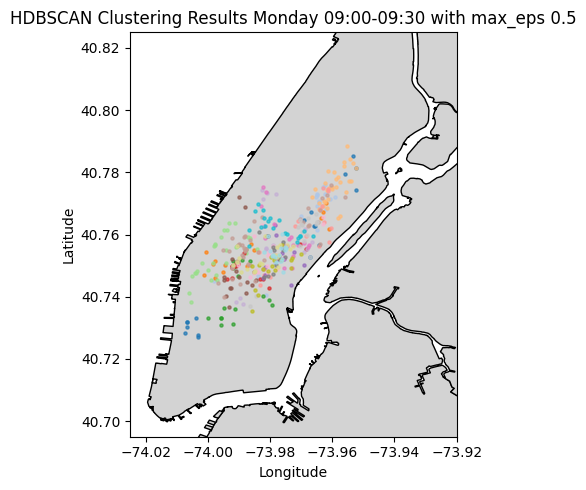

In [590]:
# @title
# Plot the clustered points on the map
fig, ax = plt.subplots(figsize=(6, 5))
boroughs_latlon.plot(ax=ax, color='lightgrey', edgecolor='black')

# Plot noise points in grey
#noise_points = rides_sample[rides_sample['cluster'] == -1]
#ax.scatter(noise_points['pickup_longitude'], noise_points['pickup_latitude'], color='grey', s=5, alpha=0.5, label='Noise')

# Plot clustered points with different colors
clustered_points = rides_sample[rides_sample['hdbscan_cluster'] != -1]
# Use a colormap for clusters
cmap = plt.cm.get_cmap('tab20', n_clusters)
for cluster_id in sorted(clustered_points['hdbscan_cluster'].unique()):
    cluster_data = clustered_points[clustered_points['hdbscan_cluster'] == cluster_id]
    ax.scatter(cluster_data['pickup_longitude'], cluster_data['pickup_latitude'],
               color=cmap(cluster_id), s=5, alpha=0.7, label=f'Cluster {cluster_id}')

ax.set_title(f'HDBSCAN Clustering Results {day_of_week} {start_hh_mm}-{end_hh_mm} with max_eps {clust_sel_eps_max}')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xlim(-74.025,-73.92)
ax.set_ylim(40.695,40.825)
ax.set_aspect('equal', adjustable='box')
# Add a legend, but it might be too crowded with many clusters
# ax.legend(loc='upper right')

plt.tight_layout()
plt.show()

In [553]:
# draw a circle for each cluster at some center point
hdbscan_cluster_circles=[]
for cluster_id in sorted(clustered_points['hdbscan_cluster'].unique()):
    cluster_data = clustered_points[clustered_points['hdbscan_cluster'] == cluster_id]
    lat_min, lon_min = cluster_data[['pickup_latitude', 'pickup_longitude']].min()
    lat_max, lon_max = cluster_data[['pickup_latitude', 'pickup_longitude']].max()
    center = [(lat_min + lat_max) / 2, (lon_min + lon_max) / 2]
    radius = haversine_distance(lat_min, lon_min, lat_max, lon_max)/2
    hdbscan_cluster_circles.append((cluster_id,center,radius))


# Convert the list of tuples to a pandas DataFrame
hdbscan_cluster_circles_df = pd.DataFrame(hdbscan_cluster_circles, columns=['cluster_id', 'center', 'radius'])

#print(cluster_circles_df)

In [592]:
#plot in folium
import folium
import numpy as np
import matplotlib

# Compute center of map
# Use the mean of all points for centering, not just clustered points
mean_lat = np.mean(rides_sample['pickup_latitude'])
mean_lon = np.mean(rides_sample['pickup_longitude'])


m = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Function to get a unique color for each cluster
def color_for_label(label):
    if label == -1:
        return "gray"  # noise
    cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
    # Normalize the cluster ID to the range [0, 1] for the colormap
    norm = matplotlib.colors.Normalize(vmin=0, vmax=n_clusters if n_clusters > 0 else 1)
    return matplotlib.colors.rgb2hex(cmap(norm(label)))


# add the clusters
cluster_centroids = clustered_points.groupby('hdbscan_cluster')[['pickup_latitude', 'pickup_longitude']].mean()
cluster_sizes=clustered_points['hdbscan_cluster'].value_counts()

for centroid in cluster_centroids.itertuples():
    folium.CircleMarker(
        location=[centroid[1], centroid[2]],
        radius=1,
        color='blue',
        fill=True,
        fill_opacity=1,
        tooltip=f"Cluster: {centroid[0]}" # Add tooltip to show cluster ID on hover
    ).add_to(m)

for index,circle in hdbscan_cluster_circles_df.iterrows():
    color = color_for_label(circle['cluster_id'])
    folium.Circle(
        location=circle['center'],
        radius=circle['radius'],
        weight=0.5,
        color=color,
        fill=True,
        fill_opacity=0.1,
        tooltip=f"Cluster Circle: {circle['cluster_id']}" # Add tooltip to show cluster ID on hover
    ).add_to(m)


# plot the clustered points and the noise points
for index, row in rides_sample.iterrows():
    cluster_id = row['hdbscan_cluster']
    color = color_for_label(cluster_id)
    size= 0.3 if cluster_id == -1 else 5

    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=size, # Adjust radius as needed
        color=color,
        fill=True,
        fill_opacity=0.7,
        tooltip=f"Cluster: {cluster_id}" # Add tooltip to show cluster ID on hover
    ).add_to(m)
#m.save('/content/drive/MyDrive/Colab Notebooks/colab data/images/hdbscan05.html')
display(m)

/tmp/ipython-input-1106212080.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
/tmp/ipython-input-1106212080.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)


In [ ]:
#can also look at some aggregated ride stats
cluster_averages = clustered_points.groupby('dbscan_cluster').agg(
    average_pickup_longitude=('pickup_longitude', 'mean'),
    average_pickup_latitude=('pickup_latitude', 'mean'),
    average_dropoff_longitude=('dropoff_longitude', 'mean'),
    average_dropoff_latitude=('dropoff_latitude', 'mean'),
    average_pickup_numeric=('pickup_numeric', 'mean')
).sort_values(by='average_pickup_numeric', ascending=True)



print("Average characteristics for each cluster:")
display(cluster_averages)

#### dbscan

In [598]:
#use dbscan instead with max epsilon
sample_min=2
epsilon=0.25 #maximum radius is 561m for 0.3, for 0.25 it is 390
dbscan = DBSCAN(min_samples=sample_min,eps=epsilon)
clusters = dbscan.fit_predict(scaled_features)
#problem here is that it's not an even density

# Add cluster labels to the dataframe
rides_sample['dbscan_cluster'] = clusters

# Print some clustering results
n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
n_noise = list(clusters).count(-1)
avg_cluster_size = np.mean(np.bincount(clusters[clusters != -1]))
max_cluster_size=np.max(np.bincount(clusters[clusters != -1]))

print(f"Estimated number of clusters: {n_clusters}")
print(f"Estimated number of noise points: {n_noise}")
print(f"Average cluster size: {avg_cluster_size}")
print(f"Max cluster size: {max_cluster_size}")

# Display the first few rows with cluster labels
display(rides_sample.head())


Estimated number of clusters: 74
Estimated number of noise points: 1496
Average cluster size: 2.22972972972973
Max cluster size: 5


,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount,trip_time_in_mins,pickup_hour,pickup_weekday,pickup_numeric,cluster,hdbscan_cluster,dbscan_cluster
357361,2013-06-03 09:16:00,2013-06-03 09:37:00,-73.975006,40.752567,-73.953590,40.766773,1260,2.49,14.0,21.000000,9,Monday,10916,-1,-1,-1
370482,2013-06-03 09:25:00,2013-06-03 09:30:00,-73.997818,40.746113,-74.004883,40.751945,300,0.81,5.5,5.000000,9,Monday,10925,-1,9,-1
1853761,2013-06-03 09:01:45,2013-06-03 09:18:50,-74.004112,40.721931,-74.006439,40.746204,1025,2.10,12.0,17.083333,9,Monday,10901,-1,-1,-1
1806296,2013-06-03 09:04:55,2013-06-03 09:12:40,-74.014984,40.716759,-74.008621,40.712364,465,0.50,6.5,7.750000,9,Monday,10904,-1,-1,-1
1826402,2013-06-03 09:18:00,2013-06-03 09:24:11,-73.991478,40.741035,-73.997147,40.734856,370,0.60,5.5,6.166667,9,Monday,10918,-1,-1,-1


I prefer using hdbscan to get some initial clusters and then doing optimisation vs kmeans


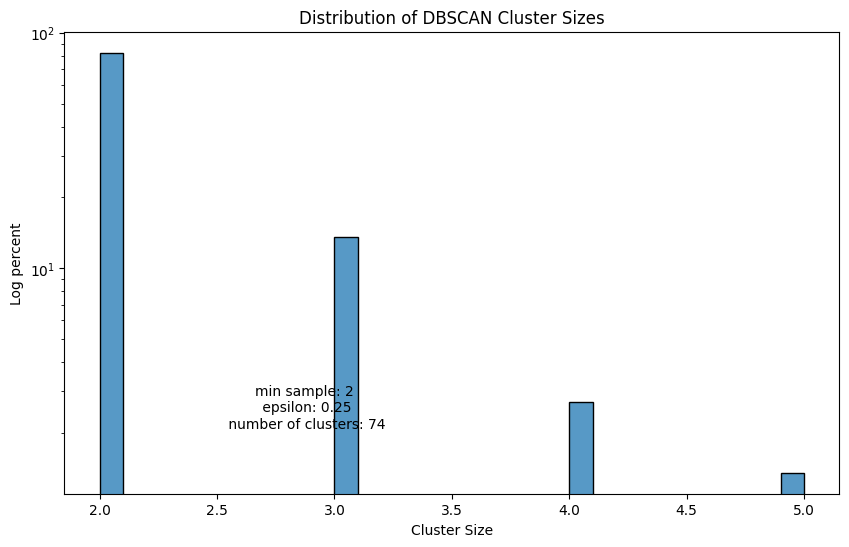

In [599]:
# points that are clustered
clustered_points = rides_sample[rides_sample['dbscan_cluster'] != -1]

# Calculate the size of each cluster (excluding noise)
cluster_sizes = rides_sample['dbscan_cluster'].value_counts()
cluster_sizes = cluster_sizes[cluster_sizes.index != -1] # Exclude noise cluster

# Plot a histogram of cluster sizes
plt.figure(figsize=(10, 6))
sns.histplot(cluster_sizes, bins=30, kde=False,stat='percent')
plt.title('Distribution of DBSCAN Cluster Sizes')
plt.xlabel('Cluster Size')
plt.ylabel('Log percent')
plt.yscale('log') # Use a log scale for the y-axis to better visualize smaller clusters
plt.text(0.5, 0.2, f"min sample: {sample_min}\n epsilon: {epsilon}\n number of clusters: {n_clusters}", horizontalalignment='center',
     verticalalignment='center', transform=ax.transAxes)
plt.show()

/tmp/ipython-input-37460583.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', n_clusters)


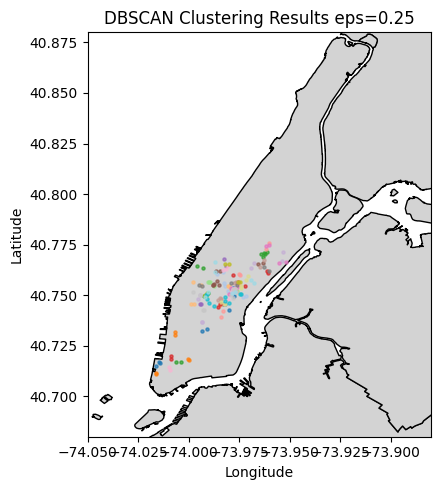

In [600]:
# Plot the clustered points on the map
fig, ax = plt.subplots(figsize=(6, 5))
boroughs_latlon.plot(ax=ax, color='lightgrey', edgecolor='black')

# Plot noise points in grey
#noise_points = rides_sample[rides_sample['cluster'] == -1]
#ax.scatter(noise_points['pickup_longitude'], noise_points['pickup_latitude'], color='grey', s=5, alpha=0.5, label='Noise')


# Use a colormap for clusters
cmap = plt.cm.get_cmap('tab20', n_clusters)
for cluster_id in sorted(clustered_points['dbscan_cluster'].unique()):
    cluster_data = clustered_points[clustered_points['dbscan_cluster'] == cluster_id]
    ax.scatter(cluster_data['pickup_longitude'], cluster_data['pickup_latitude'],
               color=cmap(cluster_id), s=5, alpha=0.7, label=f'Cluster {cluster_id}')

ax.set_title(f'DBSCAN Clustering Results eps={epsilon}')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xlim(-74.05,-73.88)
ax.set_ylim(40.68,40.88)
ax.set_aspect('equal', adjustable='box')


plt.tight_layout()
plt.show()

#when using dbscan and not heirachel, it ends up putting everything 'dense' into one cluster

In [601]:
# draw a circle for each cluster at some center point
dbscan_cluster_circles=[]
for cluster_id in sorted(clustered_points['dbscan_cluster'].unique()):
    cluster_data = clustered_points[clustered_points['dbscan_cluster'] == cluster_id]
    lat_min, lon_min = cluster_data[['pickup_latitude', 'pickup_longitude']].min()
    lat_max, lon_max = cluster_data[['pickup_latitude', 'pickup_longitude']].max()
    center = [(lat_min + lat_max) / 2, (lon_min + lon_max) / 2]
    radius = haversine_distance(lat_min, lon_min, lat_max, lon_max)/2
    dbscan_cluster_circles.append((cluster_id,center,radius))


# Convert the list of tuples to a pandas DataFrame
dbscan_cluster_circles_df = pd.DataFrame(dbscan_cluster_circles, columns=['cluster_id', 'center', 'radius'])

#print(cluster_circles_df)

In [602]:

# Compute center of map
# Use the mean of all points for centering, not just clustered points
mean_lat = np.mean(rides_sample['pickup_latitude'])
mean_lon = np.mean(rides_sample['pickup_longitude'])


m = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Function to get a unique color for each cluster
def color_for_label(label):
    if label == -1:
        return "gray"  # Noise
    cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
    # Normalize the cluster ID to the range [0, 1] for the colormap
    norm = matplotlib.colors.Normalize(vmin=0, vmax=n_clusters if n_clusters > 0 else 1)
    return matplotlib.colors.rgb2hex(cmap(norm(label)))


# add the clusters
cluster_centroids = clustered_points.groupby('dbscan_cluster')[['pickup_latitude', 'pickup_longitude']].mean()
cluster_sizes=clustered_points['dbscan_cluster'].value_counts()

for centroid in cluster_centroids.itertuples():
    folium.CircleMarker(
        location=[centroid[1], centroid[2]],
        radius=1,
        color='blue',
        fill=True,
        fill_opacity=1,
        tooltip=f"Cluster: {centroid[0]}" # Add tooltip to show cluster ID on hover
    )

for index,circle in dbscan_cluster_circles_df.iterrows():
    color = color_for_label(circle['cluster_id'])
    folium.Circle(
        location=circle['center'],
        radius=circle['radius'],
        weight=0.5,
        color=color,
        fill=True,
        fill_opacity=0.1,
        tooltip=f"Cluster Circle: {circle['cluster_id']}" # Add tooltip to show cluster ID on hover
    ).add_to(m)


# plot the clustered points and the noise points
for index, row in rides_sample.iterrows():
    cluster_id = row['dbscan_cluster']
    color = color_for_label(cluster_id)
    size= 0.3 if cluster_id == -1 else 5

    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=size, # Adjust radius as needed
        color=color,
        fill=True,
        fill_opacity=0.7,
        tooltip=f"Cluster: {cluster_id}" # Add tooltip to show cluster ID on hover
    ).add_to(m)



m.save('/content/drive/MyDrive/Colab Notebooks/colab data/images/dbscan025.html')
display(m)

/tmp/ipython-input-1167989952.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
/tmp/ipython-input-1167989952.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)


#### kmeans

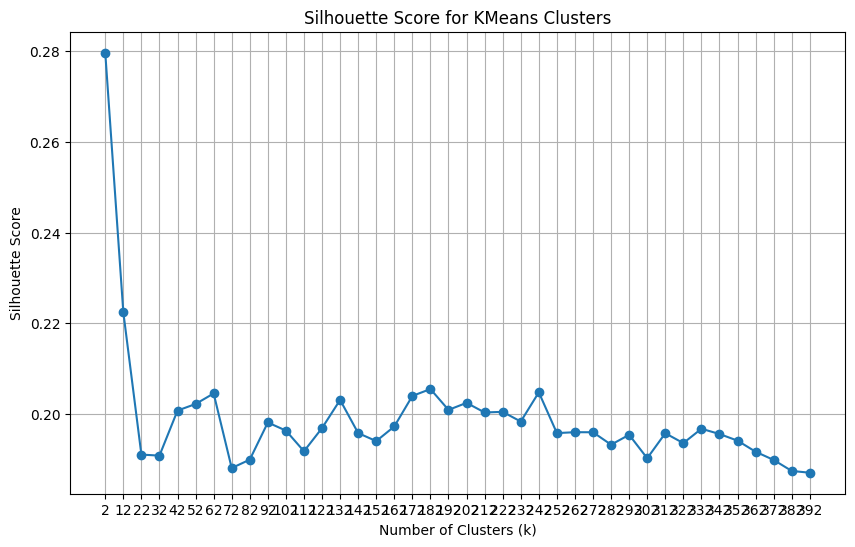

In [447]:
#try using kmeans with similar number of clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt


# Calculate silhouette score for a range of cluster numbers
silhouette_scores = []
k_range = range(2,402,10)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(scaled_features)
    score = silhouette_score(scaled_features, cluster_labels)
    silhouette_scores.append(score)

# Plot the elbow method graph
plt.figure(figsize=(10, 6))
plt.plot(k_range, silhouette_scores, marker='o')
plt.title('Silhouette Score for KMeans Clusters')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(k_range)
plt.grid(True)
plt.show()

In [636]:

n_clusters=130
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
clusters = kmeans.fit_predict(scaled_features)

# Add cluster labels to the dataframe
rides_sample['kmeans_cluster'] = clusters

cluster_sizes = rides_sample['kmeans_cluster'].value_counts()

#number of clusters with sizes more than 2
n_valid_clusters = len(cluster_sizes[cluster_sizes > 2])
n_valid_rides=sum(cluster_sizes[cluster_sizes>2])

print(f"Number of clusters with more than 2 rides: {n_valid_clusters} or {round(n_valid_clusters/n_clusters*100,2)}%")
print(f"Number of rides successfully clustered: {n_valid_rides} or {round(n_valid_rides/sample_size*100,2)}% rides")


Number of clusters with more than 2 rides: 123 or 94.62%
Number of rides successfully clustered: 1649 or 99.28% rides


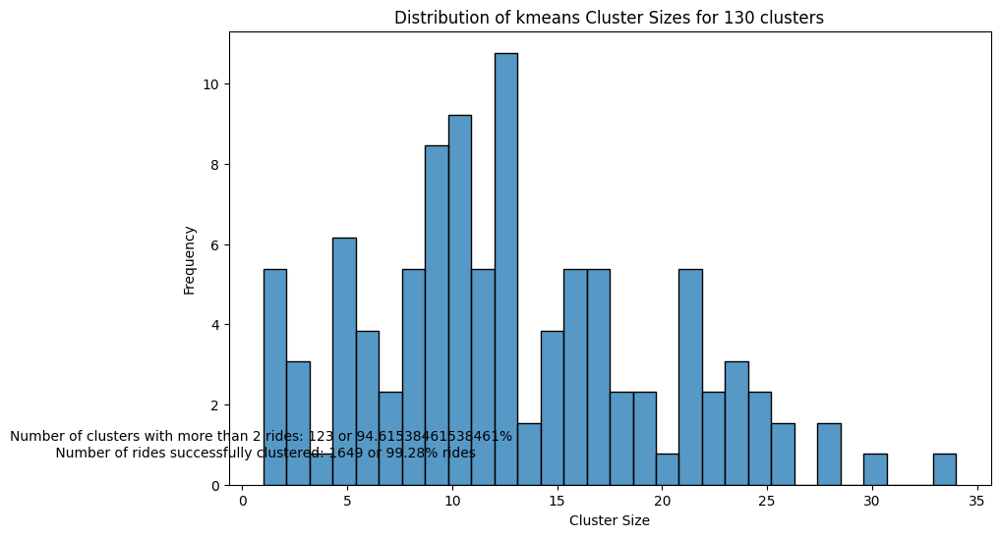

In [638]:


# Plot a histogram of cluster sizes
plt.figure(figsize=(10, 6))
sns.histplot(cluster_sizes, bins=30, kde=False,stat='percent')
plt.title(f'Distribution of kmeans Cluster Sizes for {n_clusters} clusters')
plt.text(1, 1, f"Number of clusters with more than 2 rides: {n_valid_clusters} or {n_valid_clusters/n_clusters*100}% \n Number of rides successfully clustered: {n_valid_rides} or {round(n_valid_rides/sample_size*100,2)}% rides", horizontalalignment='center',
     verticalalignment='center')
plt.xlabel('Cluster Size')
plt.ylabel('Frequency')

plt.show()

In [639]:
#summarise clusters so we can plot them

clustered_points_kmeans = rides_sample[rides_sample['kmeans_cluster'] != -1].copy() # KMeans doesn't produce noise (-1) but keep for consistency


# Group by cluster and calculate the mean longitude, latitude, and count (size)
cluster_summary = clustered_points_kmeans.groupby('kmeans_cluster').agg(
    pickup_longitude=('pickup_longitude', 'mean'),
    pickup_latitude=('pickup_latitude', 'mean'),
    dropoff_longitude=('dropoff_longitude', 'mean'),
    dropoff_latitude=('dropoff_latitude', 'mean'),
    cluster_size=('kmeans_cluster', 'count')
)

# Label valid clusters in cluster_summary
cluster_summary['is_valid'] = cluster_summary['cluster_size'] > 2

# Indicate a 'kmeans_valid' column in clustered_points_kmeans based on cluster_summary
clustered_points_kmeans = clustered_points_kmeans.merge(
    cluster_summary[['is_valid']], left_on='kmeans_cluster', right_index=True
)
clustered_points_kmeans.rename(columns={'is_valid': 'kmeans_valid'}, inplace=True)



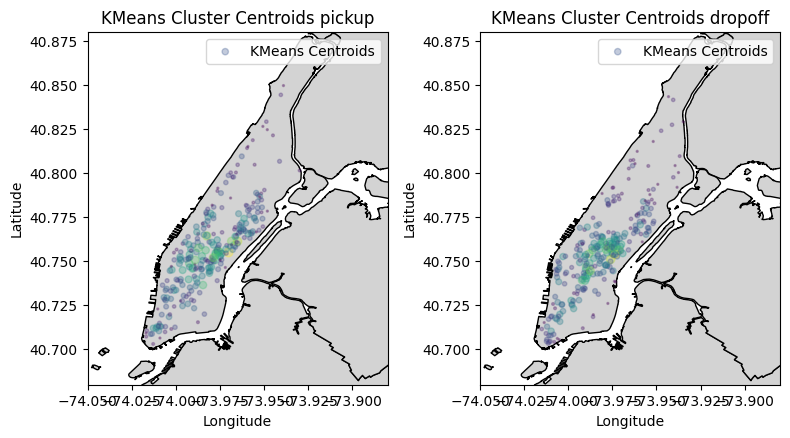

In [622]:

# Plot KMeans centroids on the map with marker size based on cluster size
fig, ax2 = plt.subplots(1, 2, figsize=(8, 12)) #pickup and drop off
ax=ax2[0]
boroughs_latlon.plot(ax=ax, color='lightgrey', edgecolor='black')
# Plot the centroids with marker size based on cluster size and alpha
scatter = ax.scatter(cluster_summary['pickup_longitude'], cluster_summary['pickup_latitude'],
            s=cluster_summary['cluster_size']*2, # Use cluster size for marker size
            c=cluster_summary['cluster_size'], # Use cluster size for color
            cmap='viridis', # Specify a colormap
            alpha=0.3, label='KMeans Centroids', zorder=3)

ax.set_title('KMeans Cluster Centroids pickup')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xlim(-74.05,-73.88)
ax.set_ylim(40.68,40.88)
ax.set_aspect('equal', adjustable='box')
ax.legend(loc='upper right')

ax1=ax2[1]
boroughs_latlon.plot(ax=ax1, color='lightgrey', edgecolor='black')
# Plot the centroids with marker size based on cluster size and alpha
scatter = ax1.scatter(cluster_summary['dropoff_longitude'], cluster_summary['dropoff_latitude'],
            s=cluster_summary['cluster_size']*2, # Use cluster size for marker size
            c=cluster_summary['cluster_size'], # Use cluster size for color
            cmap='viridis', # Specify a colormap
            alpha=0.3, label='KMeans Centroids', zorder=3)

ax1.set_title('KMeans Cluster Centroids dropoff')
ax1.set_xlabel("Longitude")
ax1.set_ylabel("Latitude")
ax1.set_xlim(-74.05,-73.88)
ax1.set_ylim(40.68,40.88)
ax1.set_aspect('equal', adjustable='box')
ax1.legend(loc='upper right')

# Add a colorbar
#cbar = fig.colorbar(scatter, ax=ax1)
#cbar.set_label('Cluster Size')


plt.tight_layout()
plt.show()

In [642]:
# draw a circle for each cluster at some center point
kmeans_cluster_circles=[]
for cluster_id in sorted(clustered_points_kmeans['kmeans_cluster'].unique()):
    cluster_data = clustered_points_kmeans[clustered_points_kmeans['kmeans_cluster'] == cluster_id]
    lat_min, lon_min = cluster_data[['pickup_latitude', 'pickup_longitude']].min()
    lat_max, lon_max = cluster_data[['pickup_latitude', 'pickup_longitude']].max()
    center = [(lat_min + lat_max) / 2, (lon_min + lon_max) / 2]
    radius = haversine_distance(lat_min, lon_min, lat_max, lon_max)/2
    kmeans_cluster_circles.append((cluster_id,center,radius))


# Convert the list of tuples to a pandas DataFrame
kmeans_cluster_circles_df = pd.DataFrame(kmeans_cluster_circles, columns=['cluster_id', 'center', 'radius'])

#print(cluster_circles_df)

In [659]:

# Compute center of map
# Use the mean of all points for centering, not just clustered points
mean_lat = np.mean(rides_sample['pickup_latitude'])
mean_lon = np.mean(rides_sample['pickup_longitude'])


m = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Function to get a unique color for each cluster
def color_for_label(label):
    cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
    # Normalize the cluster ID to the range [0, 1] for the colormap
    norm = matplotlib.colors.Normalize(vmin=0, vmax=n_clusters if n_clusters > 0 else 1)
    return matplotlib.colors.rgb2hex(cmap(norm(label)))



for index, cluster in cluster_summary.iterrows():
    folium.CircleMarker(
        location=[cluster['pickup_longitude'], cluster['pickup_latitude']],
        radius=1,
        color='blue',
        fill=True,
        fill_opacity=1,
        tooltip=f"Cluster: {index}" # Add tooltip to show cluster ID on hover
    ).add_to(m)

for index,circle in kmeans_cluster_circles_df.iterrows():
    color = color_for_label(circle['cluster_id'])
    folium.Circle(
        location=circle['center'],
        radius=circle['radius'],
        weight=0.5,
        color=color,
        fill=True,
        fill_opacity=0.1,
        tooltip=f"Cluster Circle: {circle['cluster_id']}" # Add tooltip to show cluster ID on hover
    ).add_to(m)



# plot the clustered points and the noise points
for index, row in clustered_points_kmeans.iterrows():
    cluster_id = row['kmeans_cluster']


    size= 0.3 if row['kmeans_valid'] == False else 1
    color = color_for_label(cluster_id) if row['kmeans_valid'] else 'gray'

    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=size, # Adjust radius as needed
        color=color,
        fill=True,
        fill_opacity=0.7,
        tooltip=f"Cluster: {cluster_id}" # Add tooltip to show cluster ID on hover
    ).add_to(m)



#m.save('/content/drive/MyDrive/Colab Notebooks/colab data/images/dbscan025.html')
display(m)

/tmp/ipython-input-299873553.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
/tmp/ipython-input-299873553.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)


In [666]:
# We're going to use hdbscan as a starting point

#### Alternatively, try manually cutting it into 5 minute chunks and only do spatial clustering

In [670]:
start_hh_mm='09:00'
end_hh_mm='09:05'
day_of_week='Monday'
start_time = pd.to_datetime('2013-06-03 '+start_hh_mm)
end_time = pd.to_datetime('2013-06-03 '+end_hh_mm)
rides_day=rides_df[rides_df['pickup_weekday']==day_of_week]

rides_daytime = rides_day[
    (rides_day['pickup_datetime'] >= start_time) &
    (rides_day['pickup_datetime'] < end_time)
]

# Sample up to 1000 points if there are more than 1000
sample_size = min(5000, len(rides_daytime))
sample_rides_shorter = rides_daytime.sample(n=sample_size, random_state=42) if sample_size > 0 else rides_daytime.copy()



print(f"Number of rides on {day_of_week}: {len(rides_day)}")
print(f"Number of rides found between {start_hh_mm} and {end_hh_mm} on {day_of_week}: {len(rides_daytime)}")
print(f"Number of rides selected for sample: {len(sample_rides_shorter)}")

Number of rides on Monday: 375304
Number of rides found between 09:00 and 09:05 on Monday: 1964
Number of rides selected for sample: 1964


In [671]:
# We want to cluster based on pickup and drop off coordinates, and pickup time
#using the same cluster features for all 3 clustering methods
cluster_features_spatial=sample_rides_shorter[['pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude']]
scaler=StandardScaler()
scaled_features_spatial=scaler.fit_transform(cluster_features_spatial)

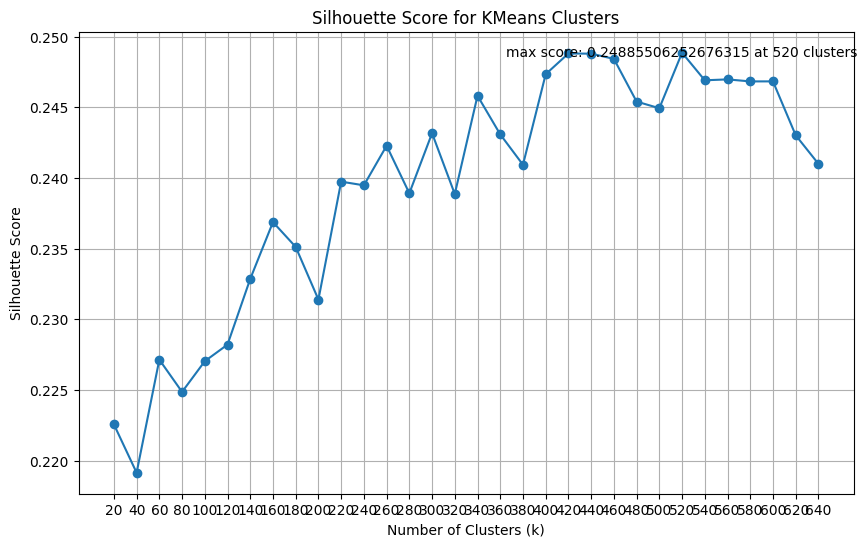

max score of silhouette score: 0.24885506252676315 at 520 clusters


In [684]:


# Calculate silhouette score for a range of cluster numbers
silhouette_scores = []
n_samples=len(cluster_features_spatial)
k_range = range(20,n_samples//3,20)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=3)
    cluster_labels = kmeans.fit_predict(scaled_features_spatial)
    score = silhouette_score(scaled_features_spatial, cluster_labels)
    silhouette_scores.append(score)

max_score=max(silhouette_scores)
max_cnum=k_range[np.argmax(silhouette_scores)]

# Plot the elbow method graph
plt.figure(figsize=(10, 6))
plt.plot(k_range, silhouette_scores, marker='o')
plt.title('Silhouette Score for KMeans Clusters')
plt.text(max_cnum, max_score, f"max score: {max_score} at {max_cnum} clusters", horizontalalignment='center',
     verticalalignment='center')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(k_range)
plt.grid(True)
plt.show()
print(f"max score of silhouette score: {max_score} at {max_cnum} clusters")

In [686]:


n_clusters=max_cnum
kmeans_spatial = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
spatial_clusters = kmeans_spatial.fit_predict(scaled_features_spatial)

# Add cluster labels to the dataframe
sample_rides_shorter['spatial_kmeans_cluster'] = spatial_clusters

cluster_sizes =  sample_rides_shorter['spatial_kmeans_cluster'].value_counts()

#number of clusters with sizes more than 2
n_valid_clusters = len(cluster_sizes[cluster_sizes > 2])
n_valid_rides=sum(cluster_sizes[cluster_sizes>2])

print(f"Number of clusters with more than 2 rides: {n_valid_clusters} or {round(n_valid_clusters/n_clusters*100,2)}%")
print(f"Number of rides successfully clustered: {n_valid_rides} or {round(n_valid_rides/n_samples*100,2)}% rides")


Number of clusters with more than 2 rides: 326 or 62.69%
Number of rides successfully clustered: 1672 or 85.13% rides


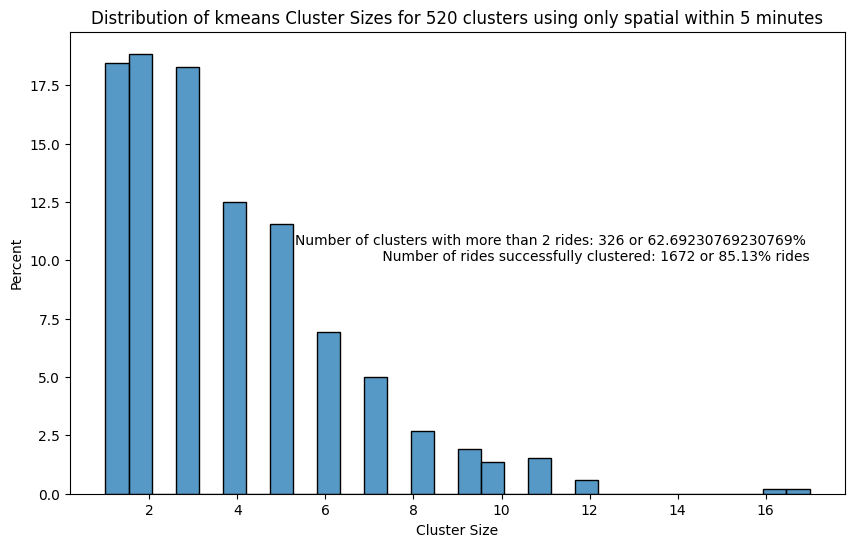

In [690]:


# Plot a histogram of cluster sizes
plt.figure(figsize=(10, 6))
sns.histplot(cluster_sizes, bins=30, kde=False,stat='percent')
plt.title(f'Distribution of kmeans Cluster Sizes for {n_clusters} clusters using only spatial within 5 minutes')
plt.text(max(cluster_sizes), 10, f"Number of clusters with more than 2 rides: {n_valid_clusters} or {n_valid_clusters/n_clusters*100}% \n Number of rides successfully clustered: {n_valid_rides} or {round(n_valid_rides/n_samples*100,2)}% rides", horizontalalignment='right')
plt.xlabel('Cluster Size')
plt.ylabel('Percent')

plt.show()

In [693]:
# draw a circle for each cluster at some center point
kmeans_spatial_cluster_circles=[]
for cluster_id in sorted(sample_rides_shorter['spatial_kmeans_cluster'].unique()):
    cluster_data = sample_rides_shorter[sample_rides_shorter['spatial_kmeans_cluster'] == cluster_id]
    lat_min, lon_min = cluster_data[['pickup_latitude', 'pickup_longitude']].min()
    lat_max, lon_max = cluster_data[['pickup_latitude', 'pickup_longitude']].max()
    center = [(lat_min + lat_max) / 2, (lon_min + lon_max) / 2]
    radius = haversine_distance(lat_min, lon_min, lat_max, lon_max)/2
    kmeans_spatial_cluster_circles.append((cluster_id,center,radius))


# Convert the list of tuples to a pandas DataFrame
kmeans_spatial_cluster_circles_df = pd.DataFrame(kmeans_spatial_cluster_circles, columns=['cluster_id', 'center', 'radius'])

#print(cluster_circles_df)

# Group by cluster and calculate the mean longitude, latitude, and count (size)
cluster_summary = sample_rides_shorter.groupby('spatial_kmeans_cluster').agg(
    pickup_longitude=('pickup_longitude', 'mean'),
    pickup_latitude=('pickup_latitude', 'mean'),
    dropoff_longitude=('dropoff_longitude', 'mean'),
    dropoff_latitude=('dropoff_latitude', 'mean'),
    cluster_size=('spatial_kmeans_cluster', 'count')
)

# Label valid clusters in cluster_summary
cluster_summary['is_valid'] = cluster_summary['cluster_size'] > 2

# Indicate a 'kmeans_valid' column in clustered_points_kmeans based on cluster_summary
sample_rides_shorter = sample_rides_shorter.merge(
    cluster_summary[['is_valid']], left_on='spatial_kmeans_cluster', right_index=True
)
sample_rides_shorter.rename(columns={'is_valid': 'kmeans_valid'}, inplace=True)
sample_rides_shorter.head()


In [705]:

# Compute center of map
# Use the mean of all points for centering, not just clustered points
mean_lat = np.mean(rides_sample['pickup_latitude'])
mean_lon = np.mean(rides_sample['pickup_longitude'])


m = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Function to get a unique color for each cluster
def color_for_label(label):
    cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
    # Normalize the cluster ID to the range [0, 1] for the colormap
    norm = matplotlib.colors.Normalize(vmin=0, vmax=n_valid_clusters if n_valid_clusters > 0 else 1)
    return matplotlib.colors.rgb2hex(cmap(norm(label)))


#plot cluster center
for index, cluster in cluster_summary.iterrows():
    color = color_for_label(index) if cluster['is_valid'] else 'gray'
    folium.CircleMarker(
        location=[cluster['pickup_longitude'], cluster['pickup_latitude']],
        radius=1,
        color=color,
        fill=True,
        fill_opacity=1,
        tooltip=f"Cluster center: {index}" # Add tooltip to show cluster ID on hover
    ).add_to(m)


for index,circle in kmeans_spatial_cluster_circles_df.iterrows():
    color = color_for_label(circle['cluster_id'])
    folium.Circle(
        location=circle['center'],
        radius=circle['radius'],
        weight=0.5,
        color=color,
        fill=True,
        fill_opacity=0.1,
        tooltip=f"Cluster Circle: {circle['cluster_id']}" # Add tooltip to show cluster ID on hover
    ).add_to(m)



# plot the clustered points and the noise points
for index, row in sample_rides_shorter.iterrows():
    cluster_id = row['spatial_kmeans_cluster']


    size= 0.3 if row['kmeans_valid'] == False else 1
    color = color_for_label(cluster_id) if row['kmeans_valid'] else 'gray'

    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=size, # Adjust radius as needed
        color=color,
        fill=True,
        fill_opacity=0.7,
        tooltip=f"Cluster point: {cluster_id}" # Add tooltip to show cluster ID on hover
    ).add_to(m)



#m.save('/content/drive/MyDrive/Colab Notebooks/colab data/images/dbscan025.html')
display(m)

/tmp/ipython-input-2250027591.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
/tmp/ipython-input-2250027591.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)


## Optimisation

In [ ]:
#murder me thanks

## DEBUGGING

The DBSCAN clustering algorithm uses two main parameters:

*   **`eps` (epsilon):** This is the maximum distance between two samples for one to be considered as in the neighborhood of the other. Points within this distance of each other are considered neighbors. A smaller `eps` will result in more clusters and potentially more noise points, while a larger `eps` will result in fewer clusters and larger clusters. You might need to tune this parameter based on the spatial density of your data.
*   **`min_samples`:** This is the number of samples in a neighborhood for a point to be considered as a core point. A core point is a point that has at least `min_samples` neighbors within the `eps` distance. Points that are not core points but are within the `eps` distance of a core point are considered border points. Points that are not core points and do not have any core points within their `eps` distance are considered noise points. A larger `min_samples` will result in fewer and denser clusters. You might need to tune this parameter as well.

In [ ]:
df=rides_df.sample(5)
df.info()
df['pickup_numeric']=(df['pickup_datetime'].dt.weekday+1)*10000+df['pickup_hour']*100+df['pickup_datetime'].dt.minute
df.head()

<class 'pandas.core.frame.DataFrame'>
Index: 5 entries, 2577957 to 230435
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   pickup_datetime    5 non-null      datetime64[ns]
 1   dropoff_datetime   5 non-null      datetime64[ns]
 2   pickup_longitude   5 non-null      float64       
 3   pickup_latitude    5 non-null      float64       
 4   dropoff_longitude  5 non-null      float64       
 5   dropoff_latitude   5 non-null      float64       
 6   trip_time_in_secs  5 non-null      int64         
 7   trip_distance      5 non-null      float64       
 8   fare_amount        5 non-null      float64       
 9   trip_time_in_mins  5 non-null      float64       
 10  pickup_hour        5 non-null      int32         
 11  pickup_weekday     5 non-null      object        
dtypes: datetime64[ns](2), float64(7), int32(1), int64(1), object(1)
memory usage: 500.0+ bytes


,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount,trip_time_in_mins,pickup_hour,pickup_weekday,pickup_numeric
2577957,2013-06-06 17:02:00,2013-06-06 17:10:00,-74.007828,40.745880,-73.994865,40.740265,480,1.03,6.5,8.0,17,Thursday,41702
2462850,2013-06-03 08:17:00,2013-06-03 08:29:00,-73.993225,40.737282,-73.981323,40.753586,720,2.10,10.0,12.0,8,Monday,10817
2073550,2013-06-05 21:42:58,2013-06-05 21:59:46,-73.990662,40.718349,-74.001724,40.744961,1008,2.50,12.5,16.8,21,Wednesday,32142
890565,2013-06-04 18:19:00,2013-06-04 18:30:00,-74.005318,40.737514,-73.985329,40.744026,660,1.59,9.0,11.0,18,Tuesday,21819
230435,2013-06-07 20:03:00,2013-06-07 20:18:00,-74.005653,40.737839,-74.004143,40.707661,900,3.63,14.0,15.0,20,Friday,52003


In [ ]:

#create geometry points for locations so we can join it with the boroughs
#do a quick test one with just the first 50 rows
df_copy=first_week_df.head(50).copy()



In [ ]:

df_copy['geometry']=gpd.points_from_xy(df_copy['pickup_longitude'], df_copy['pickup_latitude'],crs="EPSG:4326")
#df_copy['dropoff_geo']=gpd.points_from_xy(df_copy['dropoff_longitude'], df_copy['dropoff_latitude'], crs="EPSG:4326")
df_gpd=gpd.GeoDataFrame(data=df_copy, geometry='geometry')

#convert it to the same projection as the boroughs one
df_gpd=df_gpd.to_crs(boroughs_zip.crs)

In [ ]:
df_gpd_joined = gpd.sjoin(left_df=df_gpd, right_df=boroughs_zip, how='left')

<Axes: >

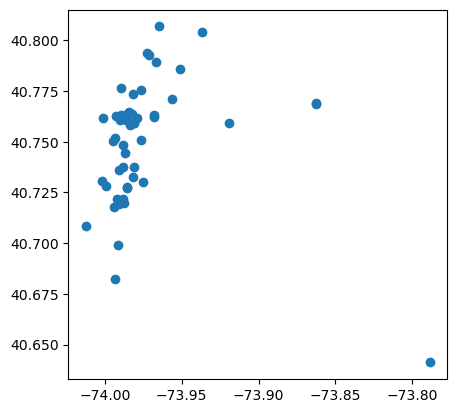

In [ ]:
df_gpd.geometry.plot()

In [ ]:

# crashes = pd.read_csv(r'/home/bera/Desktop/crashes.csv') #Some random points
# crashes['geometry'] = gpd.points_from_xy(crashes.xcoord, crashes.ycoord, crs="EPSG:4326")
# crashes = gpd.GeoDataFrame(data=crashes, geometry='geometry')

# crashes2 = gpd.sjoin(left_df=crashes, right_df=wards, how='left')
# crashes2.to_file(r'/home/bera/Desktop/crashes_with_wards.gpkg')

In [ ]:
#import pandas as pd
#import geopandas as gpd
from shapely.geometry import Point

# create pickup/dropoff GeoDataFrames, spatially join to boroughs, and add pickup_borough/dropoff_borough to first_week_df

# ensure boroughs has a CRS and use EPSG:4326 for lat/lon
if boroughs.crs is None:
    boroughs = boroughs.set_crs(epsg=4326)
else:
    boroughs = boroughs.to_crs(epsg=4326)

# helper to build GeoDataFrame for valid lat/lon coords and perform spatial join
def assign_borough(lat_col, lon_col, out_col):
    # mask valid coords (exclude exact 0,0 which in this dataset denote missing)
    valid = (
        df_copy[lon_col].between(-180, 180)
        & df_copy[lat_col].between(-90, 90)
        & ~((df_copy[lon_col].abs() < 1e-9) & (df_copy[lat_col].abs() < 1e-9))
        & df_copy[lon_col].notna()
        & df_copy[lat_col].notna()
    )

    # create GeoDataFrame only for valid rows (keeps original indices)
    gdf = gpd.GeoDataFrame(
        df_copy.loc[valid, :].copy(),
        geometry=gpd.points_from_xy(df_copy.loc[valid, lon_col], df_copy.loc[valid, lat_col]),
        crs="EPSG:4326",
    )

    # spatial join to get borough name; handle geopandas versions with predicate/op
    try:
        joined = gpd.sjoin(gdf, boroughs[['BoroName', 'geometry']], how='left', predicate='within')
    except TypeError:
        joined = gpd.sjoin(gdf, boroughs[['BoroName', 'geometry']], how='left', op='within')

    # create a Series aligned to the original dataframe index and assign
    s = pd.Series(index=df_copy.index, dtype=object)
    s.loc[joined.index] = joined['BoroName'].values
    df_copy[out_col] = s

# assign pickup and dropoff boroughs
assign_borough('pickup_latitude', 'pickup_longitude', 'pickup_borough')
assign_borough('dropoff_latitude', 'dropoff_longitude', 'dropoff_borough')

# quick sanity check
print("Pickup borough value counts (top):")
print(df_copy['pickup_borough'].value_counts(dropna=False).head())
print("\nDropoff borough value counts (top):")
print(df_copy['dropoff_borough'].value_counts(dropna=False).head())

Pickup borough value counts (top):
pickup_borough
NaN    50
Name: count, dtype: int64

Dropoff borough value counts (top):
dropoff_borough
NaN    50
Name: count, dtype: int64


<Axes: >

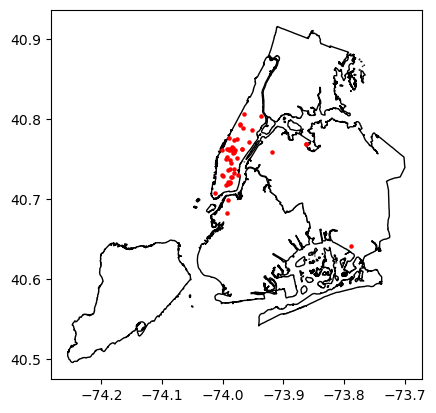

In [ ]:
ax=boroughs.plot(color='white', edgecolor='black')
df_gpd.plot(ax=ax, marker='o', color='red', markersize=5)

In [ ]:
boroughs_zip=gpd.read_file("Data_Sources\\nybb_25c")

# Generate some points
b = [int(x) for x in boroughs_zip.total_bounds]
N = 8

pointdf = gpd.GeoDataFrame(
    [
        {"geometry": Point(x, y), "value1": x + y, "value2": x - y}
        for x, y in zip(
            range(b[0], b[2], int((b[2] - b[0]) / N)),
            range(b[1], b[3], int((b[3] - b[1]) / N)),
        )
    ]
)

In [ ]:

df = pd.DataFrame(
    {
        "Latitude": [40.699284,40.732746,40.732745,40.712746],
        "Longitude": [-73.93708, -73.92708,-73.971451,-73.981451],
    }
)

pointdf = gpd.GeoDataFrame(
    [
        {"geometry": Point(x, y), "value1": x + y, "value2": x - y}
        for x, y in zip(df["Longitude"], df["Latitude"])
    ]
)




#df_copy['geometry']=gpd.points_from_xy(df_copy['pickup_longitude'], df_copy['pickup_latitude'])
#df_copy['dropoff_geo']=gpd.points_from_xy(df_copy['dropoff_longitude'], df_copy['dropoff_latitude'], crs="EPSG:4326")
df_gpd=gpd.GeoDataFrame(
    [
        {"geometry": Point(x, y)}
        for x, y in zip(df_copy['pickup_longitude'], df_copy['pickup_latitude'])
    ])
df_gpd.crs="EPSG:4326"

In [ ]:

# Make sure they're using the same projection reference
print(df_gpd.crs)
print(boroughs_zip.crs)
df_gpd=df_gpd.to_crs(boroughs_zip.crs)

EPSG:4326
EPSG:2263


<Axes: >

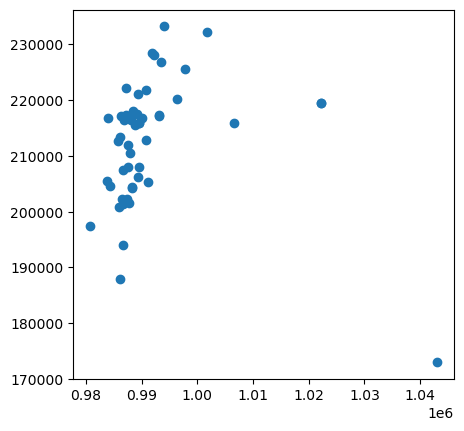

In [ ]:
df_gpd.plot()

<Axes: >

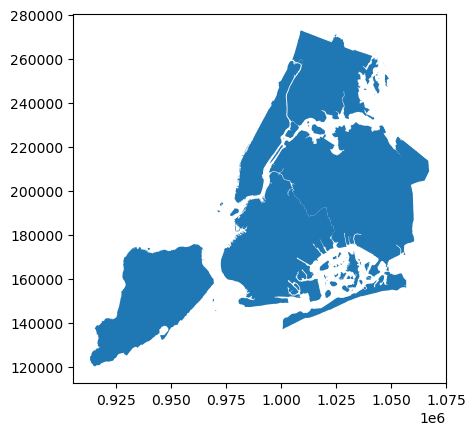

In [ ]:
boroughs_zip.plot()

In [ ]:
join_left_df = df_gpd.sjoin(boroughs_zip, how="left")
join_left_df

,geometry,index_right,BoroCode,BoroName,Shape_Leng,Shape_Area
0,POINT (989350.978 221095.007),4,1,Manhattan,359193.930112,6.366278e+08
1,POINT (984370.505 204640.486),4,1,Manhattan,359193.930112,6.366278e+08
2,POINT (1042961.949 172936.138),3,4,Queens,887905.078760,3.041419e+09
3,POINT (1022249.184 219428.668),3,4,Queens,887905.078760,3.041419e+09
4,POINT (993965.505 233247.684),4,1,Manhattan,359193.930112,6.366278e+08
5,POINT (987747.921 201496.928),4,1,Manhattan,359193.930112,6.366278e+08
6,POINT (986129.251 213289.449),4,1,Manhattan,359193.930112,6.366278e+08
7,POINT (987453.992 202223.728),4,1,Manhattan,359193.930112,6.366278e+08
8,POINT (986691.17 194044.77),2,3,Brooklyn,726953.045551,1.934463e+09
9,POINT (989360.489 206236.446),4,1,Manhattan,359193.930112,6.366278e+08


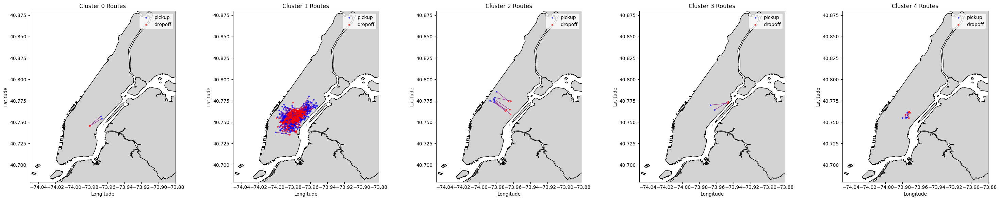

In [ ]:
# Visualize routes for a few selected clusters


# Select a few cluster IDs to visualize (excluding noise cluster -1)
cluster_ids_to_visualize = sorted(clustered_points['cluster'].unique())[:5] # Visualize the first 5 clusters

fig, axes = plt.subplots(1, len(cluster_ids_to_visualize), figsize=(6 * len(cluster_ids_to_visualize), 6))
axes = axes.flatten()

for i, cluster_id in enumerate(cluster_ids_to_visualize):
    ax = axes[i]
    boroughs_latlon.plot(ax=ax, color='lightgrey', edgecolor='black')

    cluster_data = rides_sample[rides_sample['cluster'] == cluster_id]

    # Plot each route within the cluster
    for _, r in cluster_data.iterrows():
        ax.plot([r['pickup_longitude'], r['dropoff_longitude']],
                [r['pickup_latitude'], r['dropoff_latitude']],
                color='purple', alpha=0.7, linewidth=1, zorder=2)

    # Plot pickup and dropoff points
    ax.scatter(cluster_data['pickup_longitude'], cluster_data['pickup_latitude'],
               color='blue', s=6, alpha=0.6, label='pickup', zorder=3)
    ax.scatter(cluster_data['dropoff_longitude'], cluster_data['dropoff_latitude'],
               color='red', s=6, alpha=0.6, label='dropoff', zorder=3)

    ax.set_title(f'Cluster {cluster_id} Routes')
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-74.05,-73.88)
    ax.set_ylim(40.68,40.88)
    ax.set_aspect('equal', adjustable='box')
    ax.legend(loc='upper right')

plt.tight_layout()
plt.show()